# Testing notebook for nifty fit on atmosphere TODs directly (no image)

# Try to add a nifty model for sampling the input map

numpy version: 2.1.1


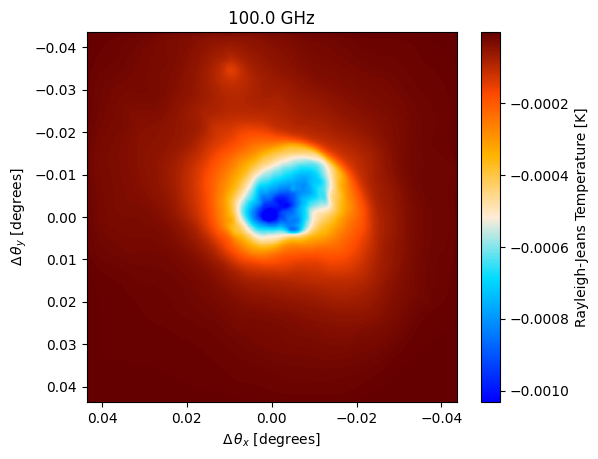

In [1]:
import numpy as np
print(f"numpy version: {np.__version__}")
import matplotlib.pyplot as plt
import maria
import sys
import os

# Relative import of sample_maps for now
sys.path.append(os.path.abspath('../python'))
import mapsampling_jax
from mapsampling_jax import sample_maps

map_filename = maria.io.fetch("maps/cluster.fits")

# load in the map from a fits file
input_map = maria.map.read_fits(filename=map_filename, #filename
                                resolution=-8.714e-05, #pixel size in degrees
                                index=0, #index for fits file
                                center=(150, 10), # position in the sky
                                units='Jy/pixel' # Units of the input map 
                               )

input_map.to(units="K_RJ").plot()

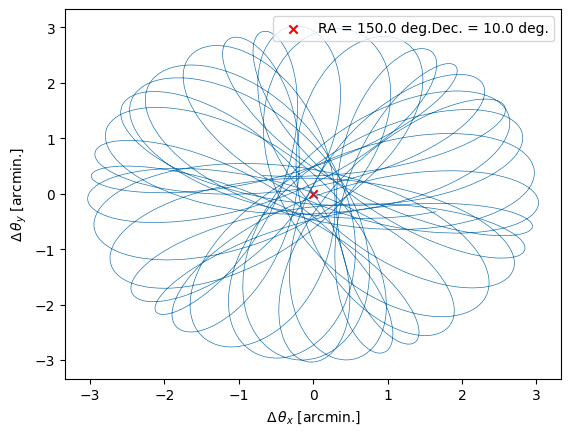

In [2]:
#load the map into maria
plan = maria.get_plan(scan_pattern="daisy", # scanning pattern
                      scan_options={"radius": 0.05, "speed": 0.01}, # in degrees
                      duration=600, # integration time in seconds
                      # duration=300, # integration time in seconds
                      sample_rate=50, # in Hz
                      scan_center=(150, 10), # position in the sky
                      frame="ra_dec")

plan.plot()

2024-10-09 14:59:18.763 INFO: Constructed instrument.
2024-10-09 14:59:18.763 INFO: Constructed plan.
2024-10-09 14:59:18.764 INFO: Constructed site.
2024-10-09 14:59:18.901 INFO: Constructed boresight.
2024-10-09 14:59:19.382 INFO: Constructed offsets.


Initialized base in 620 ms.


Generating noise: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]
Generating atmosphere: 4it [00:01,  3.68it/s]
Sampling map (m2/f093): 100%|██████████| 1/1 [00:03<00:00,  3.60s/it]


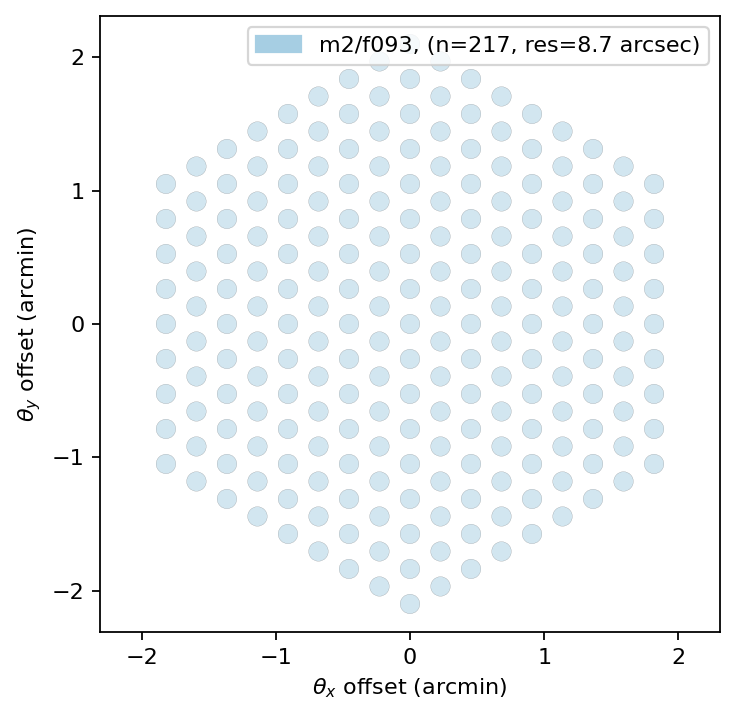

In [32]:
# instrument = maria.get_instrument('MUSTANG-2')
instrument = mapsampling_jax.instrument
instrument.plot()

sim_truthmap = maria.Simulation(instrument, 
                                plan=plan,
                                site="llano_de_chajnantor", 
                                map=input_map,
                                # noise=False,
                                atmosphere="2d",
                                # cmb="generate",
                                )

tod_truthmap = sim_truthmap.run()

In [4]:
dx, dy = sim_truthmap.coords.offsets(frame=sim_truthmap.map.frame, center=sim_truthmap.map.center)
dx = dx.compute()
dy = dy.compute()

dx

array([[-1.95983289e-04, -1.93241722e-04, -1.90020815e-04, ...,
         4.73604674e-04,  4.76804706e-04,  4.79748222e-04],
       [-2.45111164e-04, -2.42369809e-04, -2.39149155e-04, ...,
         4.28249904e-04,  4.31449653e-04,  4.34392901e-04],
       [-1.20794450e-04, -1.18052925e-04, -1.14832073e-04, ...,
         5.49482169e-04,  5.52682161e-04,  5.55625644e-04],
       ...,
       [ 1.21850892e-04,  1.24594200e-04,  1.27817191e-04, ...,
         7.60565283e-04,  7.63767623e-04,  7.66713311e-04],
       [-4.04470989e-04, -4.01727385e-04, -3.98504006e-04, ...,
         2.29422815e-04,  2.32625438e-04,  2.35571352e-04],
       [-7.45372078e-04, -7.42630682e-04, -7.39409948e-04, ...,
        -7.23698368e-05, -6.91701295e-05, -6.62269545e-05]])

Running mapper (m2/f093): 100%|██████████| 1/1 [00:06<00:00,  6.23s/it]


mapdata_truth shape: (1, 1000, 1000)
mapdata_truth mean: -8.726028151723567e-05


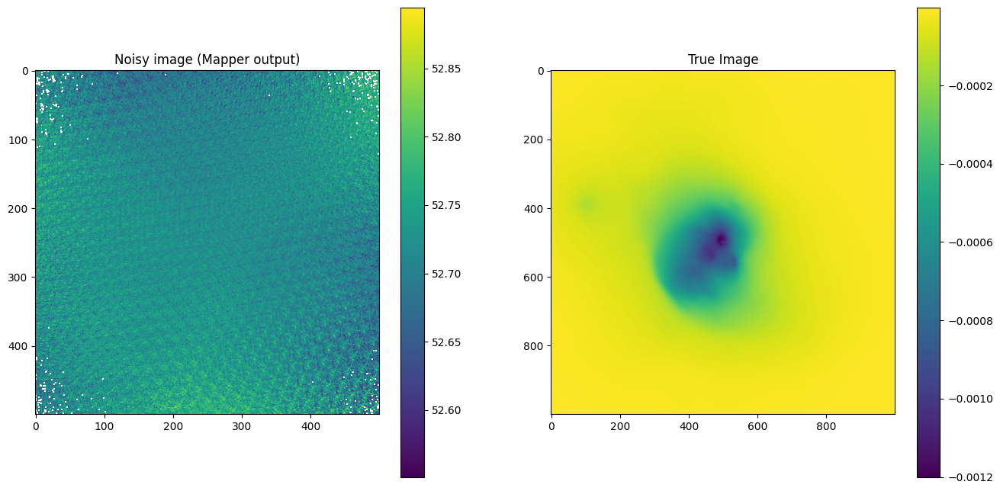

In [5]:
from maria.map.mappers import BinMapper

# Run mapper without any filtering to get noisy mimge
mapper_truthmap = BinMapper(center=(150, 10), frame="ra_dec", width=0.1, height=0.1, resolution=2e-4, map_postprocessing={"gaussian_filter": {"sigma": 0}} )
mapper_truthmap.add_tods(tod_truthmap)
output_truthmap = mapper_truthmap.run()

mapdata_truth = np.float64(sim_truthmap.map.data)
mapdata_truth = np.nan_to_num(mapdata_truth, nan=np.nanmean(mapdata_truth)) # replace nan value by img mean

print("mapdata_truth shape:", mapdata_truth.shape)
print("mapdata_truth mean:", mapdata_truth.mean())

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

im0 = axes[0].imshow(output_truthmap.data[0].T)
fig.colorbar(im0)
axes[0].title.set_text("Noisy image (Mapper output)")

im1 = axes[1].imshow(mapdata_truth[0])
fig.colorbar(im1)
axes[1].title.set_text("True Image")

plt.show()

# Re-implement map sampling in JAX for nifty response function:

In [6]:
os.environ['CUDA_VISIBLE_DEVICES'] = '2'

import jax
from jax import random
import jax.numpy as jnp

import nifty8.re as jft
import matplotlib.pyplot as plt

import numpy as np

from functools import reduce
from operator import or_

seed = 42
key = random.PRNGKey(seed)

2024-10-09 14:52:01.054 INFO: Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
2024-10-09 14:52:01.056 INFO: Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory


# Test TOD agreement:

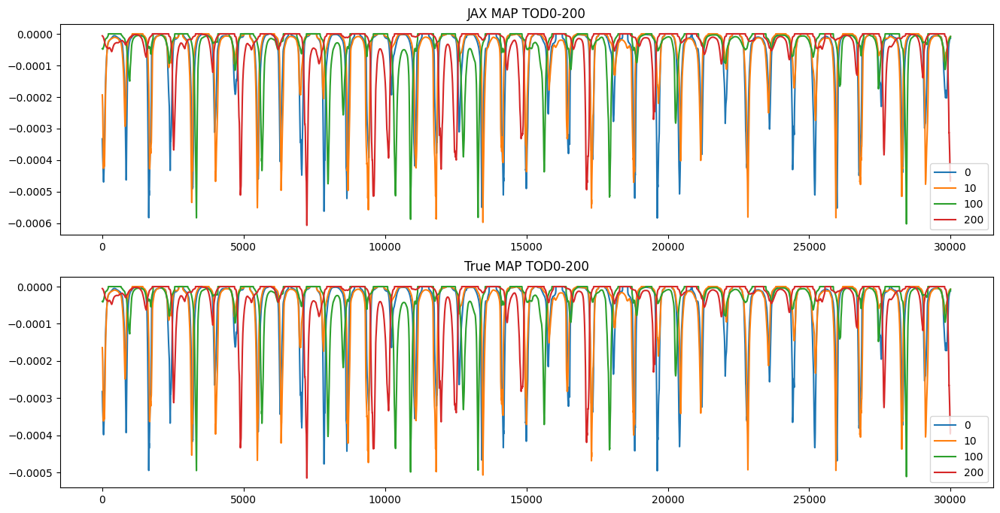

In [7]:
jax_tods_map = sample_maps(mapdata_truth, dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)

fig, axes = plt.subplots(2, 1, figsize=(16, 8))

for i in [0, 10, 100, 200]:
    im0 = axes[0].plot(jax_tods_map[i], label=i)

    tods_map = np.float64(tod_truthmap.components['map'].compute())
    im1 = axes[1].plot(tods_map[i], label=i)
    
axes[0].title.set_text(f'JAX MAP TOD0-{i}')
axes[0].legend()
axes[1].title.set_text(f'True MAP TOD0-{i}')
axes[1].legend()

plt.show()

# Smooth atmosphere TODs:

In [8]:
import scipy as sp

jax_tods_atmos = tod_truthmap.components['atmosphere']
jax_tods_atmos_smooth = np.zeros(jax_tods_atmos.shape)

for i in range(jax_tods_atmos.shape[0]):
    jax_tods_atmos_smooth[i] = sp.ndimage.gaussian_filter1d(jax_tods_atmos[i], sigma=2e2)

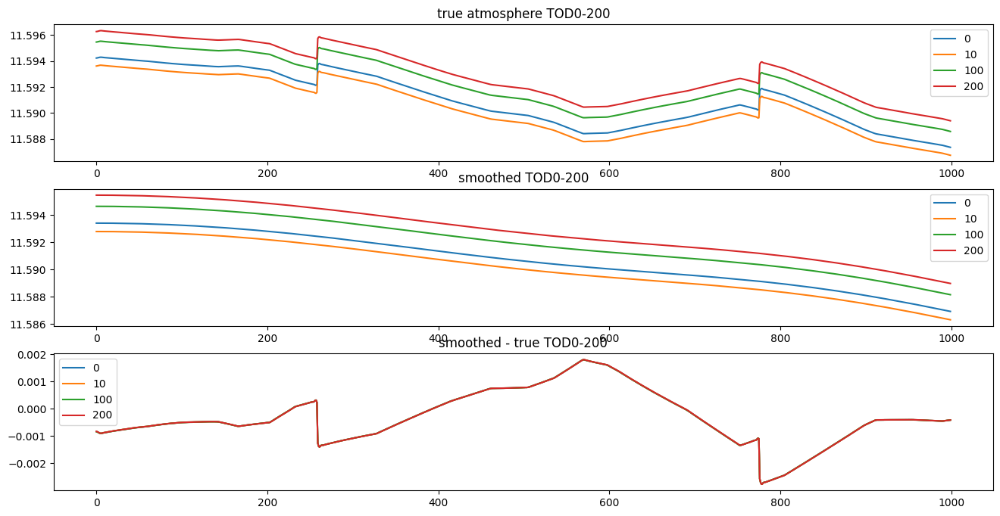

In [9]:
# plot smoothed atmos:

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

for i in [0, 10, 100, 200]:
    im0 = axes[0].plot(jax_tods_atmos[i, 0:1000], label=i)
    im1 = axes[1].plot(jax_tods_atmos_smooth[i, 0:1000], label=i)
    im2 = axes[2].plot(jax_tods_atmos_smooth[i, 0:1000] - jax_tods_atmos[i, 0:1000], label=i)
    
axes[0].title.set_text(f'true atmosphere TOD0-{i}')
axes[0].legend()
axes[1].title.set_text(f'smoothed TOD0-{i}')
axes[1].legend()
axes[2].title.set_text(f'smoothed - true TOD0-{i}')
axes[2].legend()

plt.show()

# Prepare noised input TODs:

Noise stddev: 0.00025132365


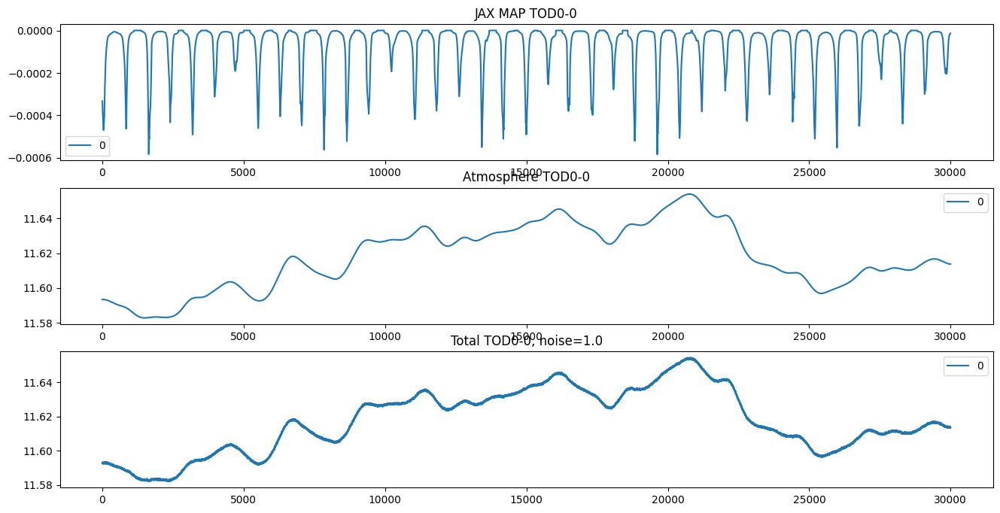

In [33]:
# Pick noise level for rest of run:
# noiselevel = 0.0
# noiselevel = 0.1
# noiselevel = 0.5
noiselevel = 1.0

# Add n TODs for atmos:
n = 1
# n = noised_jax_tod.shape[0]

jax_tods_atmos = tod_truthmap.components['atmosphere']
# noised_jax_tod = np.float64(jax_tods_map) + np.float64(jax_tods_atmos) + np.float64(tod_truthmap.components['noise']*noiselevel)

noised_jax_tod = np.float64(jax_tods_map) + np.float64(tod_truthmap.components['noise']*noiselevel)
noised_jax_tod[:n] += np.float64(jax_tods_atmos_smooth[:n]) 
# noised_jax_tod[:n] = np.float64(jax_tods_atmos_smooth[:n])

denoised_jax_tod = noised_jax_tod - np.float64(tod_truthmap.components['noise']*noiselevel)

print("Noise stddev:", np.std(tod_truthmap.components['noise'].compute()))

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

# for i in [0, 10, 100, 200]:
for i in [0]:
    im0 = axes[0].plot(jax_tods_map[i], label=i)
    # im1 = axes[1].plot(jax_tods_atmos[i], label=i)
    im1 = axes[1].plot(jax_tods_atmos_smooth[i], label=i)
    im2 = axes[2].plot(noised_jax_tod[i], label=i)
    
axes[0].title.set_text(f'JAX MAP TOD0-{i}')
axes[0].legend()
axes[1].title.set_text(f'Atmosphere TOD0-{i}')
axes[1].legend()
axes[2].title.set_text(f'Total TOD0-{i}, noise={noiselevel}')
axes[2].legend()

plt.show()

# Next, initialise nifty prior model

Start with the atmosphere TOD model:

In [11]:
dims_atmos = (jax_tods_atmos.shape[1] + 2000,)
padding_atmos = dims_atmos[0] - jax_tods_atmos.shape[1]

# correlated field zero mode GP offset and stddev
# cf_zm_tod = dict(offset_mean=jax_tods_atmos.mean().compute(), offset_std=(0.001, 0.1))
cf_zm_tod = dict(offset_mean=jax_tods_atmos.mean().compute(), offset_std=(0.0005, 0.001))

# correlated field fluctuations (mostly don't need tuning)
# fluctuations: y-offset in power spectrum in fourier space (zero mode)
# loglogavgslope: power-spectrum slope in log-log space in frequency domain (Fourier space) Jakob: -4 -- -2
# flexibility=(1.5e0, 5e-1), # deviation from simple power-law
# asperity=(5e-1, 5e-2), # small scale features in power-law
cf_fl_tod = dict(
    # fluctuations=(0.005, 0.005), 
    fluctuations=(0.005, 0.003), 
    loglogavgslope=(-3, 0.5), 
    flexibility=None,
    asperity=None,
)

# put together in correlated field model
cfm_tod = jft.CorrelatedFieldMaker("")
cfm_tod.set_amplitude_total_offset(**cf_zm_tod)
cfm_tod.add_fluctuations(
    dims_atmos, distances=1.0 / dims_atmos[0], **cf_fl_tod, prefix="tod ", non_parametric_kind="power"
)
# gp_tod = cfm_tod.finalize()

## Add one Correlated field per TOD with shared flucts and zero-mean

In [12]:
# init params for each TOD:

gps_tods = []
for i in range(n):
    cfmi = jft.CorrelatedFieldMaker(f'tod{i} ')
    # cfmi.set_amplitude_total_offset(**cf_zm_tod)
    cfmi._azm = cfm_tod._azm
    cfmi._offset_mean = cfm_tod._offset_mean
    cfmi._parameter_tree['zeromode'] = jft.ShapeWithDtype(())

    cfmi._fluctuations.append(cfm_tod._fluctuations[0])
    cfmi._target_grids.append(cfm_tod._target_grids[0])
    cfmi._parameter_tree.update(cfm_tod._fluctuations[0].domain)
    gps_tods.append(cfmi.finalize())

## Now for the map model:

In [13]:
dims_map = (1000, 1000)

# Map model

# correlated field zero mode GP offset and stddev
# cf_zm_map = dict(offset_mean=mapdata_truth.mean(), offset_std=(1e-7, 1e-6))
cf_zm_map = dict(offset_mean=mapdata_truth.mean(), offset_std=(1e-8, 1e-7))
# correlated field fluctuations (mostly don't need tuning)
cf_fl_map = dict(
    # fluctuations=(1e-6, 1e-6), # fluctuations: y-offset in power spectrum in fourier space (zero mode)
    fluctuations=(2e-6, 1e-6), # fluctuations: y-offset in power spectrum in fourier space (zero mode)
    loglogavgslope=(-2.5e0, 5e-1), # power-spectrum slope in log-log space in frequency domain (Fourier space) Jakob: -4 -- -2
    flexibility=None,
    asperity=None,
    # flexibility=(1.5e0, 5e-1), # deviation from simple power-law
    # asperity=(5e-1, 5e-2), # small scale features in power-law
)

# put together in correlated field model
cfm_map = jft.CorrelatedFieldMaker("cfmap")
cfm_map.set_amplitude_total_offset(**cf_zm_map)
cfm_map.add_fluctuations(
    dims_map, distances=1.0 / dims_map[0], **cf_fl_map, prefix="ax1", non_parametric_kind="power"
)
gp_map = cfm_map.finalize()

In [14]:
# only tod:
# class Signal_TOD(jft.Model):
#     def __init__(self, gps_tods):
#         # self.gp_tod = gp_tod
#         # super().__init__(init=self.gp_tod.init, domain=jft.Vector(gp_tod.domain))
#         self.gps_tods = gps_tods
#         self.tgt = (len(gps_tods), gps_tods[0].target.size)
#         # self.gp_map = gp_map
#         # super().__init__(init=reduce(or_, [gp.init for gp in gps_tods] + [gp_map.init]), domain=reduce(or_, [gp.domain for gp in gps_tods] + [gp_map.domain]))
#         super().__init__(init=reduce(or_, [gp.init for gp in gps_tods]), domain=reduce(or_, [gp.domain for gp in gps_tods]))
    
#     def __call__(self, x):
#         res_tods = jnp.zeros(self.tgt)
#         for i, gp in enumerate(self.gps_tods):
#             res_tods = res_tods.at[i].set(gp(x))
        
#         return res_tods[:, padding_atmos//2:-padding_atmos//2]

#         # res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1])), dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)

#         # # Only add first n atmosphere tods, otherwise use map
#         # modified_res_map = res_map.at[:n, :].add(res_tods[:, padding_atmos//2:-padding_atmos//2])

#         # return modified_res_map

# signal_response_tod = Signal_TOD(gps_tods)

# # map only:
# class Signal_TOD(jft.Model):
#     def __init__(self, gp_map):
#         # self.gp_tod = gp_tod
#         # super().__init__(init=self.gp_tod.init, domain=jft.Vector(gp_tod.domain))
#         # self.gps_tods = gps_tods
#         # self.tgt = (len(gps_tods), gps_tods[0].target.size)
#         self.gp_map = gp_map
#         # super().__init__(init=reduce(or_, [gp.init for gp in gps_tods] + [gp_map.init]), domain=reduce(or_, [gp.domain for gp in gps_tods] + [gp_map.domain]))
#         super().__init__(init=gp_map.init, domain=gp_map.domain)
    
#     def __call__(self, x):
#         # res_tods = jnp.zeros(self.tgt)
#         # for i, gp in enumerate(self.gps_tods):
#         #     res_tods = res_tods.at[i].set(gp(x))
        
#         res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1])), dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)
#         return res_map

#         # Only add first n atmosphere tods, otherwise use map
#         # modified_res_map = res_map.at[:n, :].add(res_tods[:, padding_atmos//2:-padding_atmos//2])

#         # return modified_res_map
#         # return res_tods[:, padding_atmos//2:-padding_atmos//2] + res_map
#         # return res_tods[:, padding_atmos//2:-padding_atmos//2] + res_map[:n]
  
# signal_response_tod = Signal_TOD(gp_map)

In [15]:
# Define simple signal model with added map sampling
class Signal_TOD(jft.Model):
    def __init__(self, gps_tods, gp_map):
        # self.gp_tod = gp_tod
        # super().__init__(init=self.gp_tod.init, domain=jft.Vector(gp_tod.domain))
        self.gps_tods = gps_tods
        self.tgt = (len(gps_tods), gps_tods[0].target.size)
        self.gp_map = gp_map
        super().__init__(init=reduce(or_, [gp.init for gp in gps_tods] + [gp_map.init]), domain=reduce(or_, [gp.domain for gp in gps_tods] + [gp_map.domain]))
    
    def __call__(self, x):
        res_tods = jnp.zeros(self.tgt)
        for i, gp in enumerate(self.gps_tods):
            res_tods = res_tods.at[i].set(gp(x))
        
        res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1])), dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)

        # Only add first n atmosphere tods, otherwise use map
        modified_res_map = res_map.at[:n, :].add(res_tods[:, padding_atmos//2:-padding_atmos//2])

        return modified_res_map
        # return res_tods[:, padding_atmos//2:-padding_atmos//2] + res_map
        # return res_tods[:, padding_atmos//2:-padding_atmos//2] + res_map[:n]

signal_response_tod = Signal_TOD(gps_tods, gp_map)

# Define noise covariance
# if noiselevel == 0.0: noise_cov_inv_tod = lambda x: 2.5e-4**-2 * x
if noiselevel == 0.0: noise_cov_inv_tod = lambda x: 1e-8**-2 * x
elif noiselevel == 0.1: noise_cov_inv_tod = lambda x: 1e-4**-2 * x
elif noiselevel == 0.5: noise_cov_inv_tod = lambda x: 1e-4**-2 * x
elif noiselevel == 1.0: noise_cov_inv_tod = lambda x: 2.5e-4**-2 * x

# Combine in likelihood - only fit 0th TOD for now!
# truth = noised_jax_tod[:n]
truth = noised_jax_tod
lh_tod = jft.Gaussian( truth, noise_cov_inv_tod).amend(signal_response_tod)

# lh = lh_tod + lh_map
# lh = lh_map
lh = lh_tod

# lh_map_grad = jax.grad(lh_map)
lh_tod_grad = jax.grad(lh_tod)

assuming a diagonal covariance matrix;
setting `std_inv` to `cov_inv(ones_like(data))**0.5`


In [16]:
signal_response_tod

Signal_TOD(
	<bound method Signal_TOD.__call__>,
	domain={'cfmapax1fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'cfmapax1loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'cfmapxi': ShapeWithDtype(shape=(1000, 1000), dtype=<class 'jax.numpy.float64'>),
	 'cfmapzeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'tod fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'tod loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'tod0 xi': ShapeWithDtype(shape=(32000,), dtype=<class 'jax.numpy.float64'>),
	 'zeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)},
	init=Initializer(
		{'cfmapax1fluctuations': functools.partial(<function random_like at 0x7f65fe39d620>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'cfmapax1loglogavgslope': functools.partial(<function random_like at 0x7f65fe39d620>, primals=ShapeWi

# Draw Prior sample

(217, 30000)


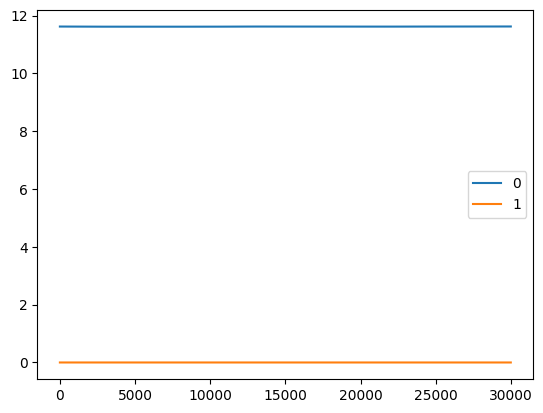

In [17]:
key, sub = jax.random.split(key)
xi = jft.random_like(sub, signal_response_tod.domain)
res = signal_response_tod(xi)
print(res.shape)

# for i in range(res.shape[0]):
for i in [0, 1]:
    plt.plot(np.arange(0, res.shape[1]), res[i], label=i)
plt.legend()
plt.show()

# MAP fit

In [18]:
n_it = 1
# delta = 1e-4 # default
# delta = 1e-8 # map
# tod
if noiselevel == 0.0: delta = 1e-4
elif noiselevel == 0.1: delta = 1e-10
elif noiselevel == 0.5: delta = 1e-10
elif noiselevel == 1.0: delta = 1e-4

n_samples = 0 # no samples -> maximum aposteriory posterior

key, k_i, k_o = random.split(key, 3)

samples, state = jft.optimize_kl(
    lh, # likelihood
    jft.Vector(lh.init(k_i)), # initial position in model space (initialisation)
    n_total_iterations=n_it, # no of optimisation steps (global)
    n_samples=n_samples, # draw samples
    key=k_o, # random jax init
    draw_linear_kwargs=dict( # sampling parameters
        cg_name="SL",
        cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=60),
    ),
    nonlinearly_update_kwargs=dict( # map from multivariate gaussian to more compl. distribution (coordinate transformations)
        minimize_kwargs=dict(
            name="SN",
            xtol=delta,
            cg_kwargs=dict(name=None),
            maxiter=5,
        )
    ),
    kl_kwargs=dict( # shift transformed multivar gauss to best match true posterior
        minimize_kwargs=dict(
            # name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=60 # map
            name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=20 # map
        )
    ),
    sample_mode="nonlinear_resample", # how steps are combined (samples + nonlin + KL)
)

OPTIMIZE_KL: Starting 0001
M: →:0.5 ↺:False #∇²:06 |↘|:3.568644e+01 ➽:1.032006e+02
M: Iteration 1 ⛰:+5.078776e+07 Δ⛰:4.225420e+07
OPTIMIZE_KL: Iteration 0001 ⛰:+5.0788e+07
OPTIMIZE_KL: #(KL minimization steps) 1
OPTIMIZE_KL: Likelihood residual(s):
'reduced χ²: 1.5e+01±     0.0, avg:   -0.058±     0.0, #dof:6510000'

OPTIMIZE_KL: Prior residual(s):
cfmapax1fluctuations    :: 'reduced χ²:    0.17±     0.0, avg:    -0.41±     0.0, #dof:      1'
cfmapax1loglogavgslope  :: 'reduced χ²:    0.26±     0.0, avg:    -0.51±     0.0, #dof:      1'
cfmapxi                 :: 'reduced χ²:     1.0±     0.0, avg: +0.00066±     0.0, #dof:1000000'
cfmapzeromode           :: 'reduced χ²:    0.17±     0.0, avg:    -0.41±     0.0, #dof:      1'
tod fluctuations        :: 'reduced χ²:     5.6±     0.0, avg:     +2.4±     0.0, #dof:      1'
tod loglogavgslope      :: 'reduced χ²:     2.9±     0.0, avg:     +1.7±     0.0, #dof:      1'
tod0 xi                 :: 'reduced χ²:     1.0±     0.0, avg:   -0.006± 

In [19]:
samples.pos

Vector(
	{'cfmapax1fluctuations': Array(-0.41367281, dtype=float64),
	 'cfmapax1loglogavgslope': Array(-0.51457096, dtype=float64),
	 'cfmapxi': Array([[-1.03498176, -0.07483647,  0.7480946 , ..., -0.94524916,
	         1.08358135,  0.07016159],
	       [ 0.07976577,  2.25381655,  1.14317748, ..., -0.19682897,
	         0.05581134, -0.12821151],
	       [ 0.74698988,  1.02118619, -1.100615  , ...,  1.24381889,
	         0.51500256,  1.30349476],
	       ...,
	       [-1.62004967, -0.25583306, -1.48423591, ..., -0.63245556,
	         1.63144582, -1.20242118],
	       [ 1.17494428,  0.66661934, -0.79889055, ...,  0.54964743,
	         0.35163432,  1.33453948],
	       [-0.51074211,  0.63588594, -0.81360967, ...,  0.60478206,
	        -0.24801911, -0.50307075]], dtype=float64),
	 'cfmapzeromode': Array(-0.40877149, dtype=float64),
	 'tod fluctuations': Array(2.37152887, dtype=float64),
	 'tod loglogavgslope': Array(1.71582468, dtype=float64),
	 'tod0 xi': Array([-0.65074666, -1.14400422, 

In [20]:
def printfitresults():
    print("Fit Results (res, init, std)")

    print("\nTODs:")
    print(f"\tfluctuations: {jft.LogNormalPrior(*cf_fl_tod['fluctuations'])(samples.pos['tod fluctuations'])}, {cf_fl_tod['fluctuations'][0]}, {cf_fl_tod['fluctuations'][1]}")
    print(f"\tloglogvarslope: {jft.NormalPrior(*cf_fl_tod['loglogavgslope'])(samples.pos['tod loglogavgslope'])}, {cf_fl_tod['loglogavgslope'][0]}, {cf_fl_tod['loglogavgslope'][1]}")
    print(f"\tzeromode std (LogNormal): {jft.LogNormalPrior(*cf_zm_tod['offset_std'])(samples.pos['zeromode'])}, {cf_zm_tod['offset_std'][0]}, {cf_zm_tod['offset_std'][1]}")

    # If custom zeromode per TOD:
    # for i in range(n):
    #     test = samples.pos[f"tod{i} zeromode"]
    #     print(f"tod{i} zeromode: {jft.LogNormalPrior(cf_zm_tod['offset_mean'], cf_zm_tod['offset_std'][0])(test)}, {cf_zm_tod['offset_mean']}, {cf_zm_tod['offset_std'][0]}")
    
    print("map:")
    print(f"\tfluctuations: {jft.LogNormalPrior(*cf_fl_map['fluctuations'])(samples.pos['cfmapax1fluctuations'])}, {cf_fl_map['fluctuations'][0]}, {cf_fl_map['fluctuations'][1]}")
    print(f"\tloglogvarslope: {jft.NormalPrior(*cf_fl_map['loglogavgslope'])(samples.pos['cfmapax1loglogavgslope'])}, {cf_fl_map['loglogavgslope'][0]}, {cf_fl_map['loglogavgslope'][1]}")
    print(f"\tzeromode std (LogNormal): {jft.LogNormalPrior(*cf_zm_map['offset_std'])(samples.pos['cfmapzeromode'])}, {cf_zm_map['offset_std'][0]}, {cf_zm_map['offset_std'][1]}")
    
    
printfitresults()

Fit Results (res, init, std)

TODs:
	fluctuations: 0.01597043530718236, 0.005, 0.003
	loglogvarslope: -2.142087660475909, -3, 0.5
	zeromode std (LogNormal): 3.498222046092439e-05, 0.0005, 0.001
map:
	fluctuations: 1.4713264520720116e-06, 2e-06, 1e-06
	loglogvarslope: -2.7572854787602044, -2.5, 0.5
	zeromode std (LogNormal): 4.134858160934176e-10, 1e-08, 1e-07


(217, 30000)


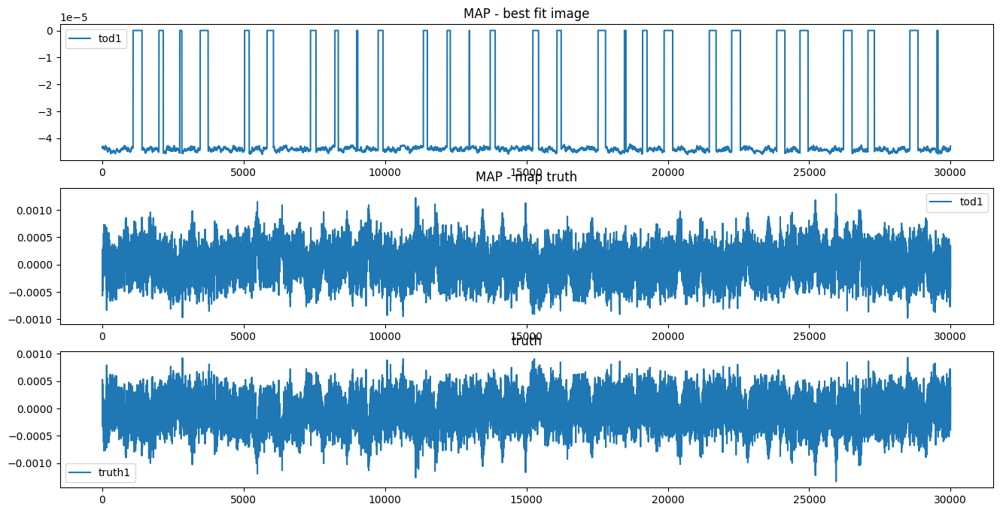

In [21]:
res = signal_response_tod(samples.pos)
print(res.shape)

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

# for i in range(0, res.shape[0], res.shape[0]//10):
for i in [1]:
    im0 = axes[0].plot(np.arange(0, res.shape[1]), res[i], label=f"tod{i}")
    im1 = axes[1].plot(np.arange(0, res.shape[1]), res[i] - truth[i], label=f"tod{i}")
    im2 = axes[2].plot(truth[i], label=f"truth{i}")

axes[0].title.set_text('MAP - best fit image')
axes[0].legend()
axes[1].title.set_text('MAP - map truth')
axes[1].legend()
axes[2].title.set_text('truth')
axes[2].legend()

plt.show()

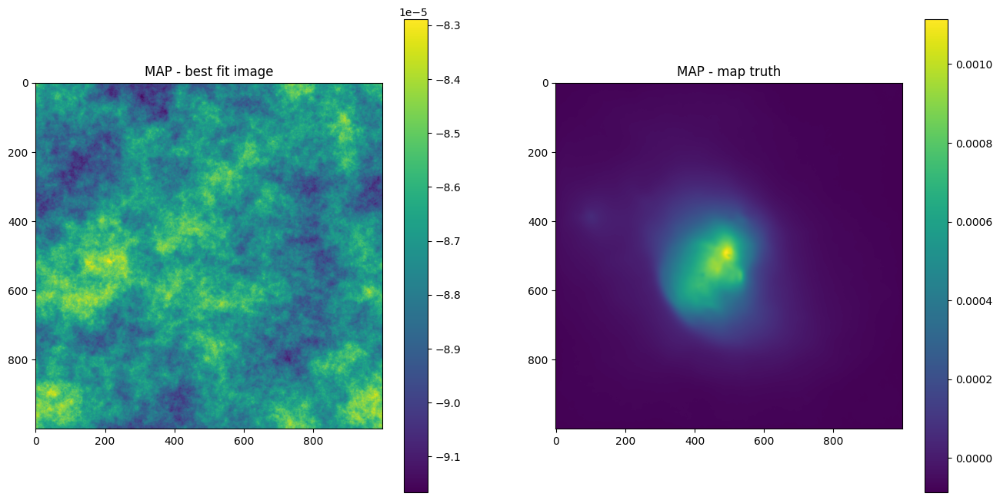

In [22]:
# plot maximum of posterior (mode)
sig_map = gp_map(samples.pos) # when splitting up in different field models

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

im0 = axes[0].imshow(sig_map)
axes[0].title.set_text('MAP - best fit image')
fig.colorbar(im0)

im1 = axes[1].imshow( sig_map - mapdata_truth[0] )
axes[1].title.set_text('MAP - map truth')
# im1 = axes[1].imshow( (sig_map - mapdata_truth) )
# axes[1].title.set_text('diff prediction - map truth')
fig.colorbar(im1)

plt.show()

In [23]:
# assert False

## Full nifty fit:

OPTIMIZE_KL: Starting 0001
SL: Iteration 0 ⛰:-4.3699e+05 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:-4.8028e+05 Δ⛰:4.3293e+04 ➽:1.0320e+01
SL: Iteration 2 ⛰:-5.0154e+05 Δ⛰:2.1257e+04 ➽:1.0320e+01
SL: Iteration 3 ⛰:-5.0693e+05 Δ⛰:5.3962e+03 ➽:1.0320e+01
SL: Iteration 4 ⛰:-5.1167e+05 Δ⛰:4.7351e+03 ➽:1.0320e+01
SL: Iteration 5 ⛰:-5.1368e+05 Δ⛰:2.0113e+03 ➽:1.0320e+01
SL: Iteration 6 ⛰:-5.1426e+05 Δ⛰:5.8313e+02 ➽:1.0320e+01
SL: Iteration 7 ⛰:-5.1502e+05 Δ⛰:7.5755e+02 ➽:1.0320e+01
SL: Iteration 8 ⛰:-5.1553e+05 Δ⛰:5.0378e+02 ➽:1.0320e+01
SL: Iteration 9 ⛰:-5.1575e+05 Δ⛰:2.2053e+02 ➽:1.0320e+01
SL: Iteration 10 ⛰:-5.1600e+05 Δ⛰:2.5349e+02 ➽:1.0320e+01
SL: Iteration 11 ⛰:-5.1627e+05 Δ⛰:2.6709e+02 ➽:1.0320e+01
SL: Iteration 12 ⛰:-5.1627e+05 Δ⛰:5.1918e+00 ➽:1.0320e+01
SL: Iteration 0 ⛰:-3.4177e+05 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:-4.9896e+05 Δ⛰:1.5719e+05 ➽:1.0320e+01
SL: Iteration 2 ⛰:-5.0843e+05 Δ⛰:9.4701e+03 ➽:1.0320e+01
SL: Iteration 3 ⛰:-5.1007e+05 Δ⛰:1.6428e+03 ➽:1.0320e+01
SL: Iteration 4

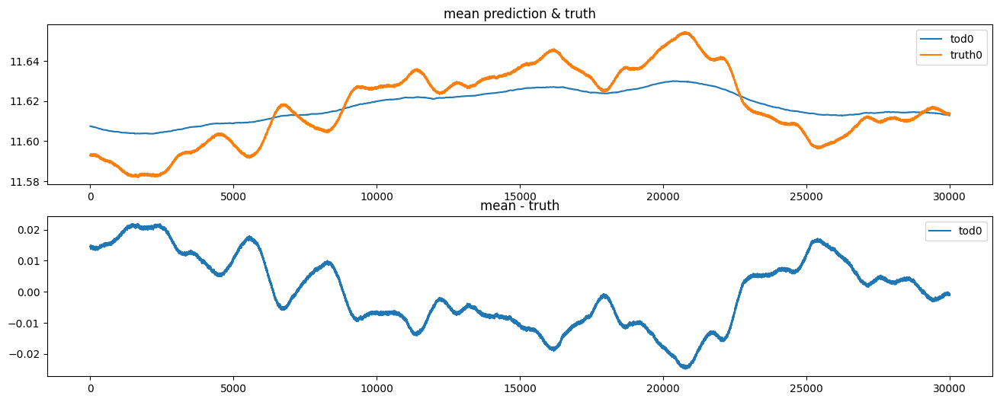

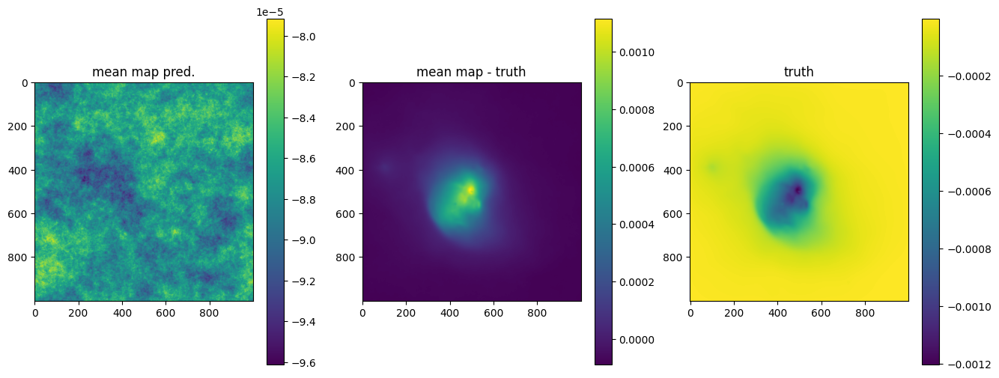

OPTIMIZE_KL: Starting 0002
SL: Iteration 0 ⛰:+1.8694e+05 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+5.1964e+03 Δ⛰:1.8175e+05 ➽:1.0320e+01
SL: Iteration 2 ⛰:-4.8417e+05 Δ⛰:4.8937e+05 ➽:1.0320e+01
SL: Iteration 3 ⛰:-4.8940e+05 Δ⛰:5.2305e+03 ➽:1.0320e+01
SL: Iteration 4 ⛰:-4.9493e+05 Δ⛰:5.5273e+03 ➽:1.0320e+01
SL: Iteration 5 ⛰:-5.0212e+05 Δ⛰:7.1963e+03 ➽:1.0320e+01
SL: Iteration 6 ⛰:-5.0606e+05 Δ⛰:3.9326e+03 ➽:1.0320e+01
SL: Iteration 7 ⛰:-5.0924e+05 Δ⛰:3.1801e+03 ➽:1.0320e+01
SL: Iteration 8 ⛰:-5.0926e+05 Δ⛰:1.9218e+01 ➽:1.0320e+01
SL: Iteration 9 ⛰:-5.1070e+05 Δ⛰:1.4434e+03 ➽:1.0320e+01
SL: Iteration 10 ⛰:-5.1256e+05 Δ⛰:1.8567e+03 ➽:1.0320e+01
SL: Iteration 11 ⛰:-5.1328e+05 Δ⛰:7.2830e+02 ➽:1.0320e+01
SL: Iteration 12 ⛰:-5.1411e+05 Δ⛰:8.2889e+02 ➽:1.0320e+01
SL: Iteration 13 ⛰:-5.1412e+05 Δ⛰:1.0057e+01 ➽:1.0320e+01
SL: Iteration 0 ⛰:+1.1061e+06 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:-4.2220e+05 Δ⛰:1.5283e+06 ➽:1.0320e+01
SL: Iteration 2 ⛰:-4.7059e+05 Δ⛰:4.8389e+04 ➽:1.0320e+01
SL: Iteration 

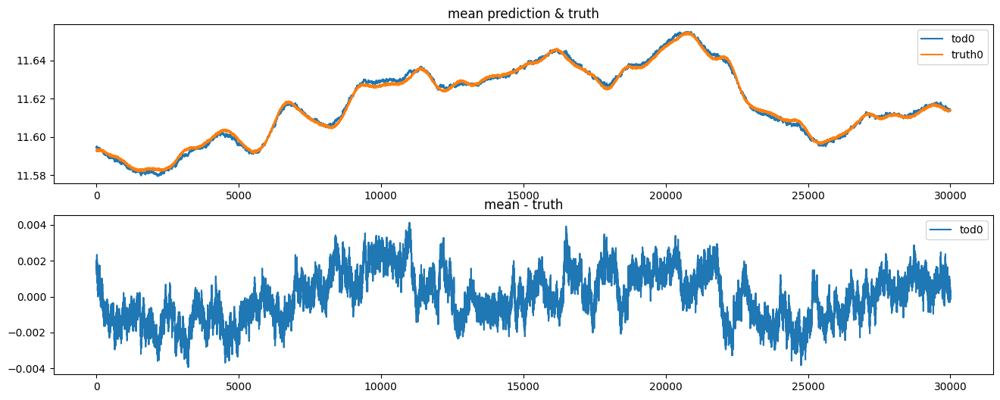

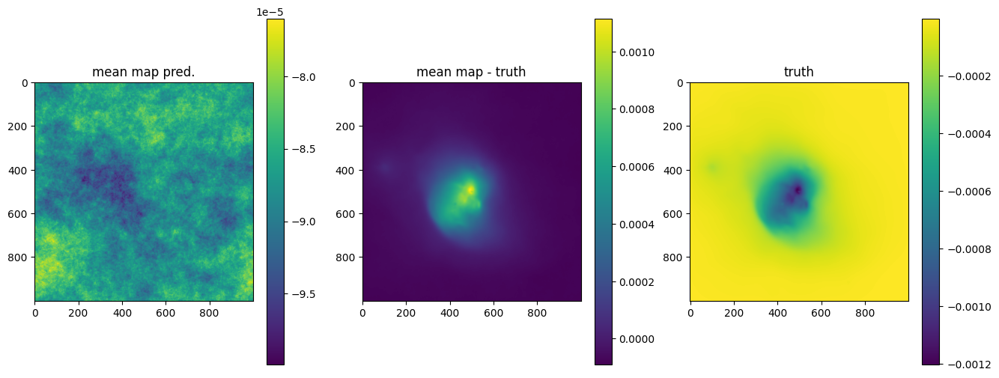

OPTIMIZE_KL: Starting 0003
SL: Iteration 0 ⛰:+7.0270e+05 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+6.2910e+05 Δ⛰:7.3605e+04 ➽:1.0320e+01
SL: Iteration 2 ⛰:+3.3762e+05 Δ⛰:2.9148e+05 ➽:1.0320e+01
SL: Iteration 3 ⛰:-1.4922e+05 Δ⛰:4.8684e+05 ➽:1.0320e+01
SL: Iteration 4 ⛰:-2.6484e+05 Δ⛰:1.1561e+05 ➽:1.0320e+01
SL: Iteration 5 ⛰:-3.0886e+05 Δ⛰:4.4018e+04 ➽:1.0320e+01
SL: Iteration 6 ⛰:-3.4897e+05 Δ⛰:4.0115e+04 ➽:1.0320e+01
SL: Iteration 7 ⛰:-3.8714e+05 Δ⛰:3.8168e+04 ➽:1.0320e+01
SL: Iteration 8 ⛰:-3.8724e+05 Δ⛰:1.0240e+02 ➽:1.0320e+01
SL: Iteration 9 ⛰:-4.0414e+05 Δ⛰:1.6903e+04 ➽:1.0320e+01
SL: Iteration 10 ⛰:-4.1981e+05 Δ⛰:1.5669e+04 ➽:1.0320e+01
SL: Iteration 11 ⛰:-4.3320e+05 Δ⛰:1.3384e+04 ➽:1.0320e+01
SL: Iteration 12 ⛰:-4.3909e+05 Δ⛰:5.8933e+03 ➽:1.0320e+01
SL: Iteration 13 ⛰:-4.4284e+05 Δ⛰:3.7505e+03 ➽:1.0320e+01
SL: Iteration 14 ⛰:-4.5125e+05 Δ⛰:8.4083e+03 ➽:1.0320e+01
SL: Iteration 15 ⛰:-4.5396e+05 Δ⛰:2.7141e+03 ➽:1.0320e+01
SL: Iteration 16 ⛰:-4.6040e+05 Δ⛰:6.4391e+03 ➽:1.0320e+01
SL: 

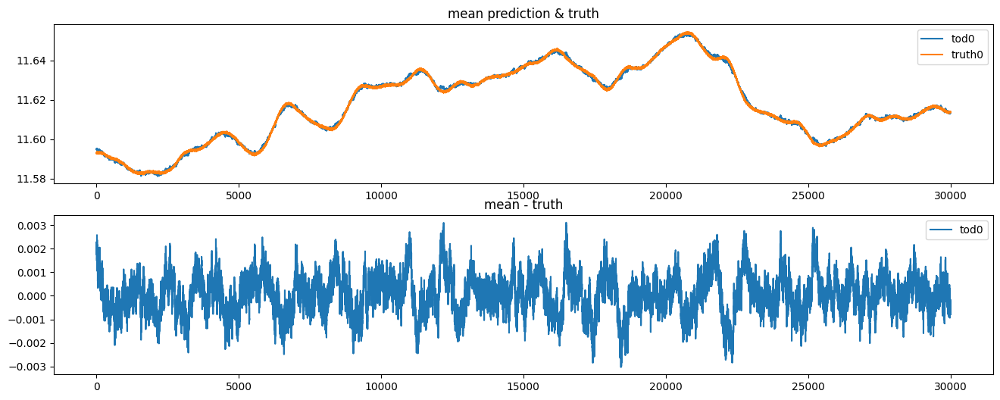

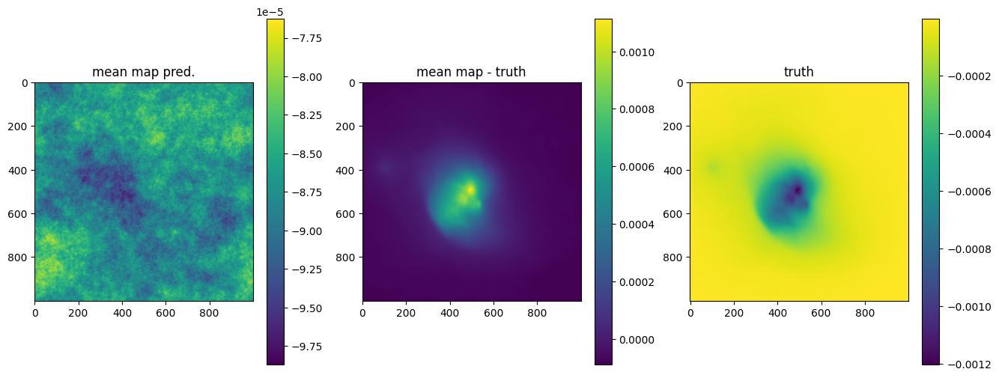

OPTIMIZE_KL: Starting 0004
SL: Iteration 0 ⛰:+5.5478e+06 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+2.6179e+06 Δ⛰:2.9299e+06 ➽:1.0320e+01
SL: Iteration 2 ⛰:+3.5110e+05 Δ⛰:2.2668e+06 ➽:1.0320e+01
SL: Iteration 3 ⛰:+2.7755e+04 Δ⛰:3.2334e+05 ➽:1.0320e+01
SL: Iteration 4 ⛰:-2.1188e+05 Δ⛰:2.3964e+05 ➽:1.0320e+01
SL: Iteration 5 ⛰:-2.7988e+05 Δ⛰:6.8003e+04 ➽:1.0320e+01
SL: Iteration 6 ⛰:-3.3333e+05 Δ⛰:5.3442e+04 ➽:1.0320e+01
SL: Iteration 7 ⛰:-3.7973e+05 Δ⛰:4.6400e+04 ➽:1.0320e+01
SL: Iteration 8 ⛰:-3.8031e+05 Δ⛰:5.8451e+02 ➽:1.0320e+01
SL: Iteration 9 ⛰:-3.9834e+05 Δ⛰:1.8030e+04 ➽:1.0320e+01
SL: Iteration 10 ⛰:-4.1696e+05 Δ⛰:1.8623e+04 ➽:1.0320e+01
SL: Iteration 11 ⛰:-4.3194e+05 Δ⛰:1.4971e+04 ➽:1.0320e+01
SL: Iteration 12 ⛰:-4.3598e+05 Δ⛰:4.0481e+03 ➽:1.0320e+01
SL: Iteration 13 ⛰:-4.4213e+05 Δ⛰:6.1458e+03 ➽:1.0320e+01
SL: Iteration 14 ⛰:-4.5094e+05 Δ⛰:8.8124e+03 ➽:1.0320e+01
SL: Iteration 15 ⛰:-4.5394e+05 Δ⛰:2.9972e+03 ➽:1.0320e+01
SL: Iteration 16 ⛰:-4.6090e+05 Δ⛰:6.9589e+03 ➽:1.0320e+01
SL: 

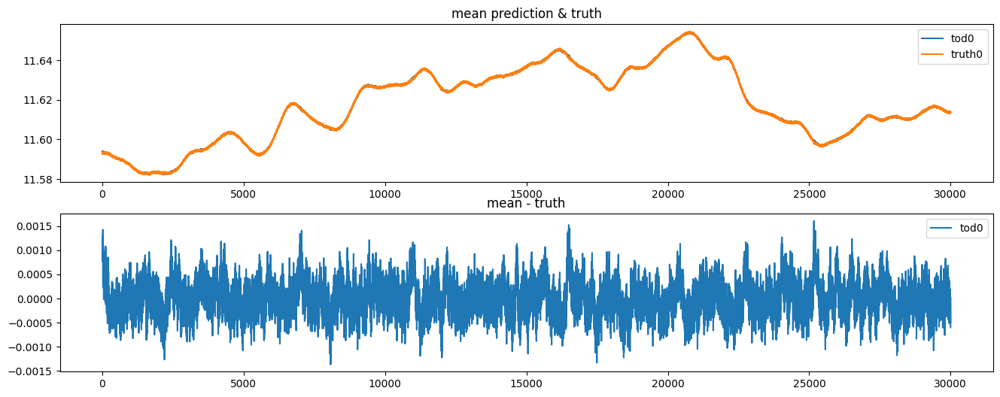

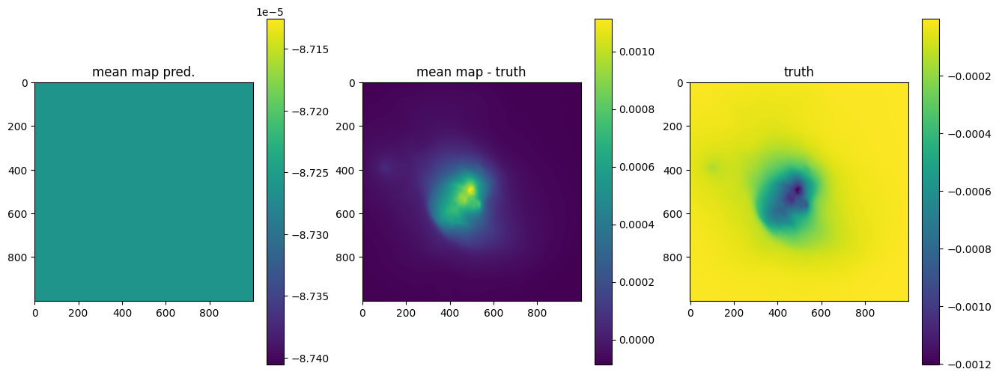

OPTIMIZE_KL: Starting 0005
SL: Iteration 0 ⛰:+3.6073e+06 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+2.2694e+06 Δ⛰:1.3379e+06 ➽:1.0320e+01
SL: Iteration 2 ⛰:+4.1677e+04 Δ⛰:2.2277e+06 ➽:1.0320e+01
SL: Iteration 3 ⛰:-1.8570e+05 Δ⛰:2.2738e+05 ➽:1.0320e+01
SL: Iteration 4 ⛰:-3.5632e+05 Δ⛰:1.7062e+05 ➽:1.0320e+01
SL: Iteration 5 ⛰:-3.8163e+05 Δ⛰:2.5309e+04 ➽:1.0320e+01
SL: Iteration 6 ⛰:-4.1109e+05 Δ⛰:2.9462e+04 ➽:1.0320e+01
SL: Iteration 7 ⛰:-4.4980e+05 Δ⛰:3.8709e+04 ➽:1.0320e+01
SL: Iteration 8 ⛰:-4.5006e+05 Δ⛰:2.5901e+02 ➽:1.0320e+01
SL: Iteration 9 ⛰:-4.6311e+05 Δ⛰:1.3050e+04 ➽:1.0320e+01
SL: Iteration 10 ⛰:-4.7477e+05 Δ⛰:1.1660e+04 ➽:1.0320e+01
SL: Iteration 11 ⛰:-4.7695e+05 Δ⛰:2.1778e+03 ➽:1.0320e+01
SL: Iteration 12 ⛰:-4.8205e+05 Δ⛰:5.1010e+03 ➽:1.0320e+01
SL: Iteration 13 ⛰:-4.8831e+05 Δ⛰:6.2627e+03 ➽:1.0320e+01
SL: Iteration 14 ⛰:-4.8832e+05 Δ⛰:1.4180e+01 ➽:1.0320e+01
SL: Iteration 15 ⛰:-4.9343e+05 Δ⛰:5.1053e+03 ➽:1.0320e+01
SL: Iteration 16 ⛰:-4.9459e+05 Δ⛰:1.1639e+03 ➽:1.0320e+01
SL: 

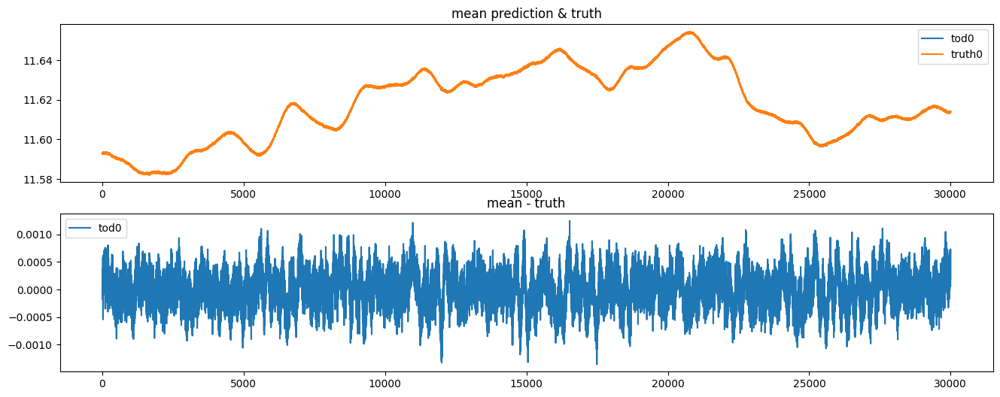

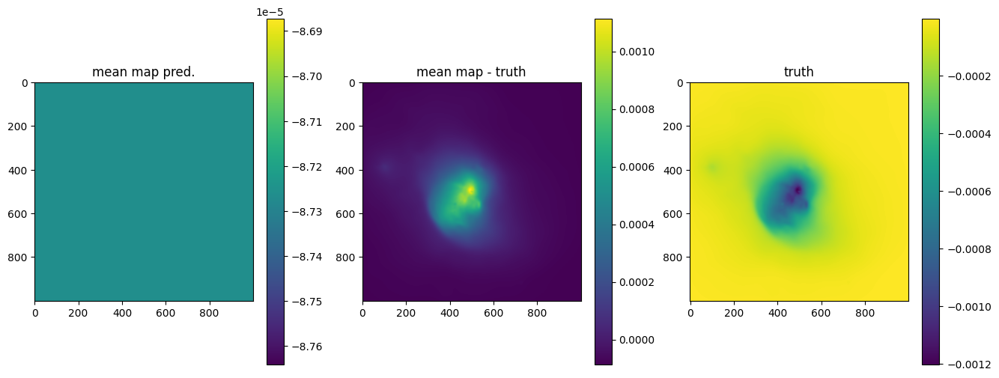

OPTIMIZE_KL: Starting 0006
SL: Iteration 0 ⛰:+9.3645e+07 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+1.4177e+06 Δ⛰:9.2227e+07 ➽:1.0320e+01
SL: Iteration 2 ⛰:+2.9440e+05 Δ⛰:1.1233e+06 ➽:1.0320e+01
SL: Iteration 3 ⛰:+1.8899e+04 Δ⛰:2.7550e+05 ➽:1.0320e+01
SL: Iteration 4 ⛰:-3.3443e+05 Δ⛰:3.5332e+05 ➽:1.0320e+01
SL: Iteration 5 ⛰:-4.0140e+05 Δ⛰:6.6977e+04 ➽:1.0320e+01
SL: Iteration 6 ⛰:-4.6673e+05 Δ⛰:6.5331e+04 ➽:1.0320e+01
SL: Iteration 7 ⛰:-4.7622e+05 Δ⛰:9.4824e+03 ➽:1.0320e+01
SL: Iteration 8 ⛰:-4.7914e+05 Δ⛰:2.9242e+03 ➽:1.0320e+01
SL: Iteration 9 ⛰:-4.8525e+05 Δ⛰:6.1116e+03 ➽:1.0320e+01
SL: Iteration 10 ⛰:-4.9183e+05 Δ⛰:6.5801e+03 ➽:1.0320e+01
SL: Iteration 11 ⛰:-4.9241e+05 Δ⛰:5.7644e+02 ➽:1.0320e+01
SL: Iteration 12 ⛰:-4.9749e+05 Δ⛰:5.0786e+03 ➽:1.0320e+01
SL: Iteration 13 ⛰:-4.9997e+05 Δ⛰:2.4792e+03 ➽:1.0320e+01
SL: Iteration 14 ⛰:-4.9997e+05 Δ⛰:3.0816e+00 ➽:1.0320e+01
SL: Iteration 0 ⛰:+8.9709e+05 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:-4.3261e+04 Δ⛰:9.4036e+05 ➽:1.0320e+01
SL: Iteration

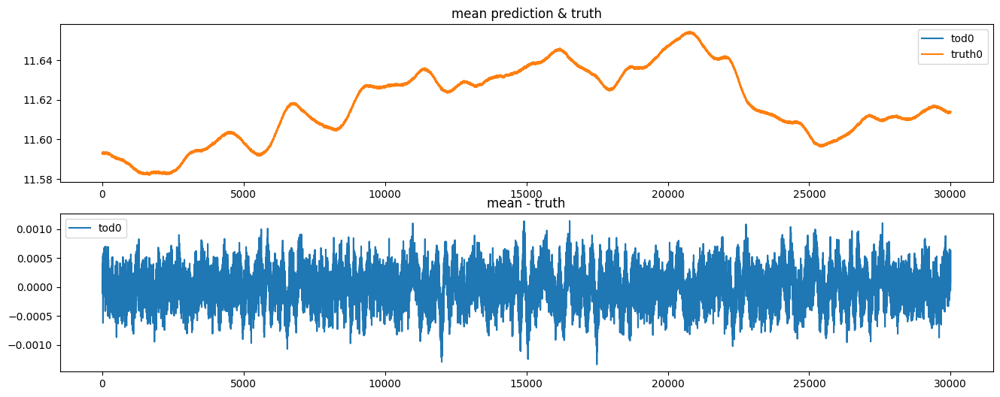

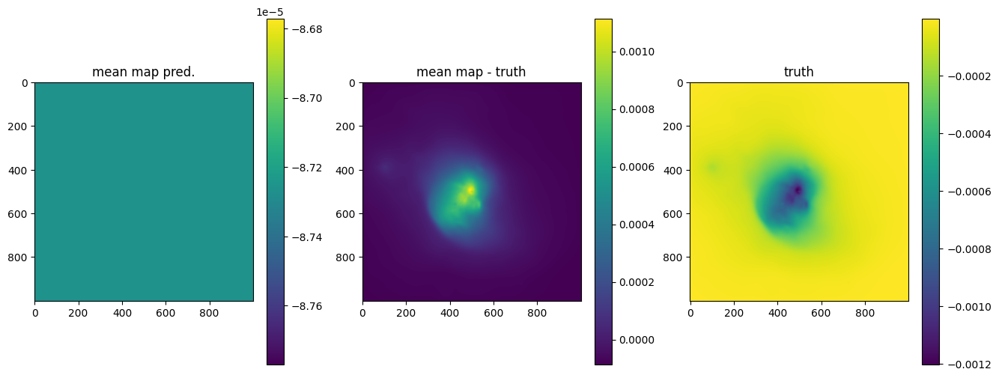

OPTIMIZE_KL: Starting 0007
SL: Iteration 0 ⛰:+2.1096e+06 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+3.0361e+05 Δ⛰:1.8060e+06 ➽:1.0320e+01
SL: Iteration 2 ⛰:-2.4258e+05 Δ⛰:5.4619e+05 ➽:1.0320e+01
SL: Iteration 3 ⛰:-3.7527e+05 Δ⛰:1.3269e+05 ➽:1.0320e+01
SL: Iteration 4 ⛰:-4.0229e+05 Δ⛰:2.7020e+04 ➽:1.0320e+01
SL: Iteration 5 ⛰:-4.7404e+05 Δ⛰:7.1749e+04 ➽:1.0320e+01
SL: Iteration 6 ⛰:-4.8388e+05 Δ⛰:9.8375e+03 ➽:1.0320e+01
SL: Iteration 7 ⛰:-4.9322e+05 Δ⛰:9.3448e+03 ➽:1.0320e+01
SL: Iteration 8 ⛰:-4.9324e+05 Δ⛰:1.5271e+01 ➽:1.0320e+01
SL: Iteration 9 ⛰:-4.9618e+05 Δ⛰:2.9439e+03 ➽:1.0320e+01
SL: Iteration 10 ⛰:-5.0072e+05 Δ⛰:4.5343e+03 ➽:1.0320e+01
SL: Iteration 11 ⛰:-5.0086e+05 Δ⛰:1.4717e+02 ➽:1.0320e+01
SL: Iteration 12 ⛰:-5.0286e+05 Δ⛰:1.9913e+03 ➽:1.0320e+01
SL: Iteration 13 ⛰:-5.0465e+05 Δ⛰:1.7893e+03 ➽:1.0320e+01
SL: Iteration 14 ⛰:-5.0465e+05 Δ⛰:6.5682e-01 ➽:1.0320e+01
SL: Iteration 0 ⛰:+2.6147e+07 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+1.5584e+06 Δ⛰:2.4589e+07 ➽:1.0320e+01
SL: Iteration

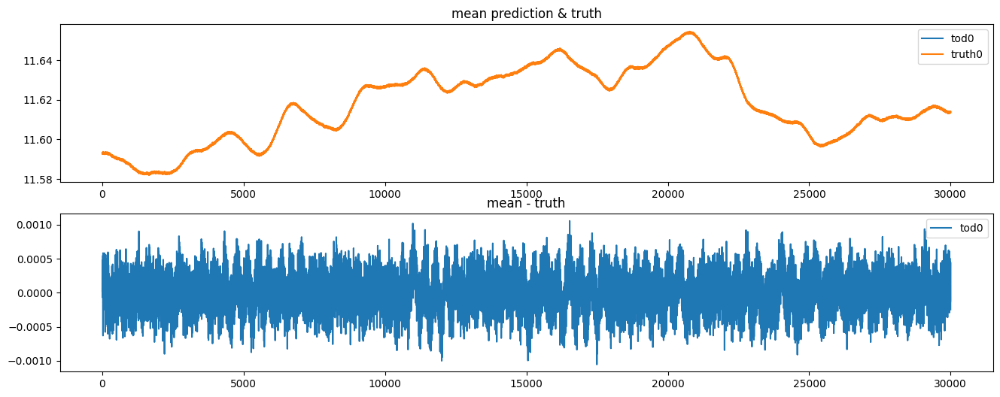

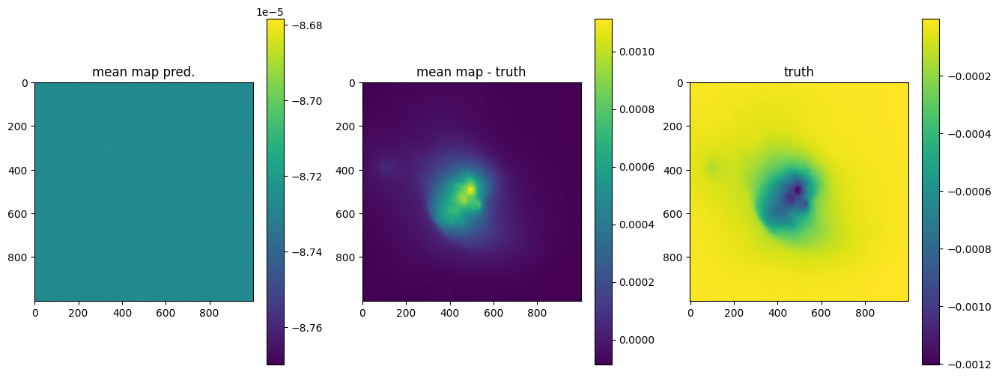

OPTIMIZE_KL: Starting 0008
SL: Iteration 0 ⛰:+6.9656e+05 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:-6.5038e+04 Δ⛰:7.6160e+05 ➽:1.0320e+01
SL: Iteration 2 ⛰:-2.8210e+05 Δ⛰:2.1707e+05 ➽:1.0320e+01
SL: Iteration 3 ⛰:-3.5675e+05 Δ⛰:7.4644e+04 ➽:1.0320e+01
SL: Iteration 4 ⛰:-4.0505e+05 Δ⛰:4.8304e+04 ➽:1.0320e+01
SL: Iteration 5 ⛰:-4.4619e+05 Δ⛰:4.1136e+04 ➽:1.0320e+01
SL: Iteration 6 ⛰:-4.7572e+05 Δ⛰:2.9537e+04 ➽:1.0320e+01
SL: Iteration 7 ⛰:-4.7782e+05 Δ⛰:2.0925e+03 ➽:1.0320e+01
SL: Iteration 8 ⛰:-4.9538e+05 Δ⛰:1.7562e+04 ➽:1.0320e+01
SL: Iteration 9 ⛰:-4.9898e+05 Δ⛰:3.6037e+03 ➽:1.0320e+01
SL: Iteration 10 ⛰:-5.0343e+05 Δ⛰:4.4504e+03 ➽:1.0320e+01
SL: Iteration 11 ⛰:-5.0347e+05 Δ⛰:3.2165e+01 ➽:1.0320e+01
SL: Iteration 12 ⛰:-5.0690e+05 Δ⛰:3.4306e+03 ➽:1.0320e+01
SL: Iteration 13 ⛰:-5.0690e+05 Δ⛰:7.5687e-01 ➽:1.0320e+01
SL: Iteration 0 ⛰:+2.1183e+06 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+8.1006e+05 Δ⛰:1.3083e+06 ➽:1.0320e+01
SL: Iteration 2 ⛰:-1.4655e+05 Δ⛰:9.5661e+05 ➽:1.0320e+01
SL: Iteration 

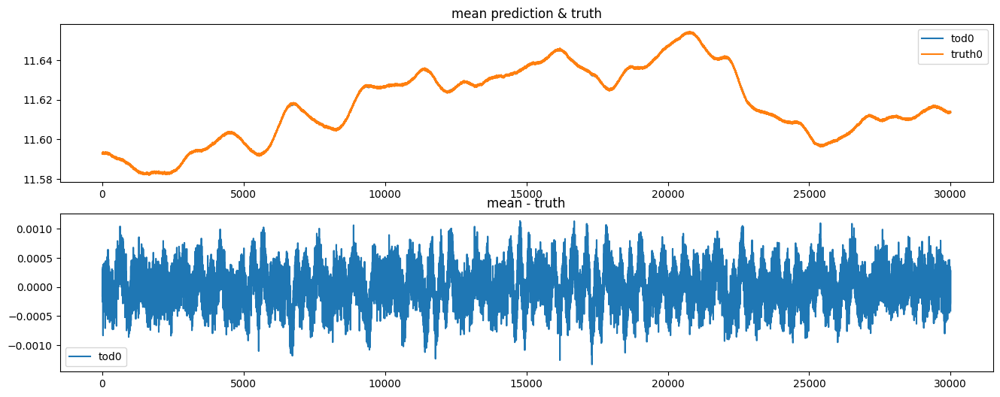

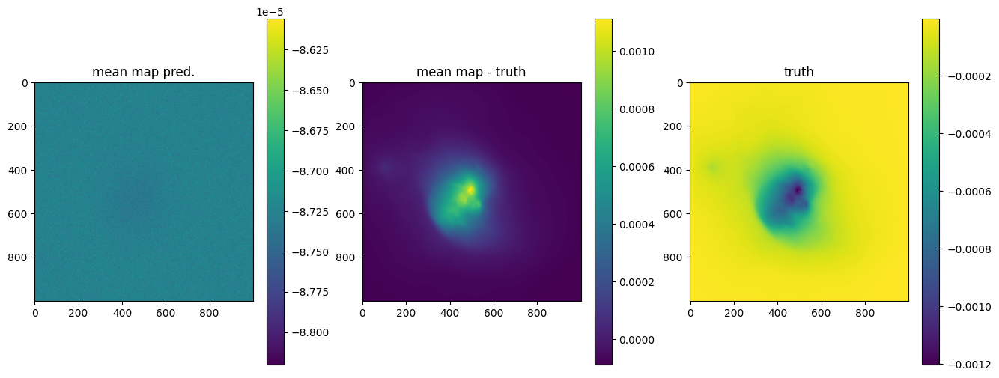

OPTIMIZE_KL: Starting 0009
SL: Iteration 0 ⛰:+8.6771e+06 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+2.0277e+06 Δ⛰:6.6494e+06 ➽:1.0320e+01
SL: Iteration 2 ⛰:-1.3486e+05 Δ⛰:2.1626e+06 ➽:1.0320e+01
SL: Iteration 3 ⛰:-3.2611e+05 Δ⛰:1.9125e+05 ➽:1.0320e+01
SL: Iteration 4 ⛰:-4.0792e+05 Δ⛰:8.1810e+04 ➽:1.0320e+01
SL: Iteration 5 ⛰:-4.7126e+05 Δ⛰:6.3339e+04 ➽:1.0320e+01
SL: Iteration 6 ⛰:-4.8839e+05 Δ⛰:1.7135e+04 ➽:1.0320e+01
SL: Iteration 7 ⛰:-4.8864e+05 Δ⛰:2.5114e+02 ➽:1.0320e+01
SL: Iteration 8 ⛰:-4.9386e+05 Δ⛰:5.2130e+03 ➽:1.0320e+01
SL: Iteration 9 ⛰:-5.0077e+05 Δ⛰:6.9167e+03 ➽:1.0320e+01
SL: Iteration 10 ⛰:-5.0339e+05 Δ⛰:2.6192e+03 ➽:1.0320e+01
SL: Iteration 11 ⛰:-5.0358e+05 Δ⛰:1.9151e+02 ➽:1.0320e+01
SL: Iteration 12 ⛰:-5.0669e+05 Δ⛰:3.1048e+03 ➽:1.0320e+01
SL: Iteration 13 ⛰:-5.0669e+05 Δ⛰:4.0994e-01 ➽:1.0320e+01
SL: Iteration 0 ⛰:+5.5746e+06 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+1.6701e+06 Δ⛰:3.9045e+06 ➽:1.0320e+01
SL: Iteration 2 ⛰:-4.1524e+05 Δ⛰:2.0854e+06 ➽:1.0320e+01
SL: Iteration 

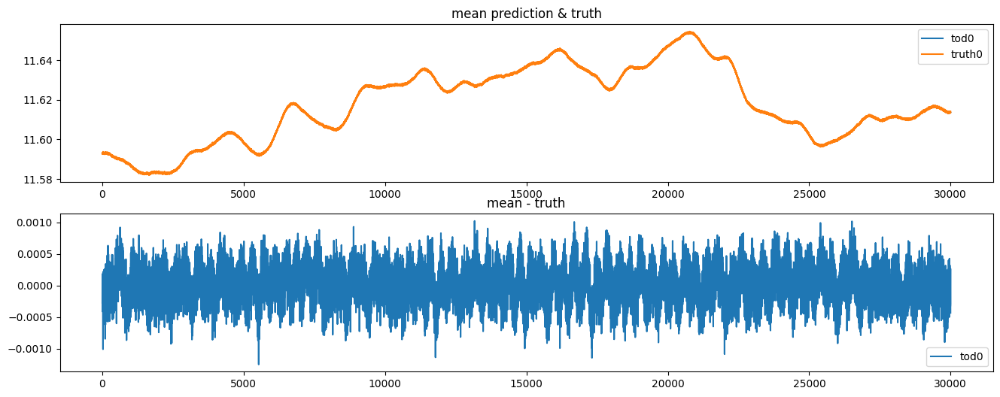

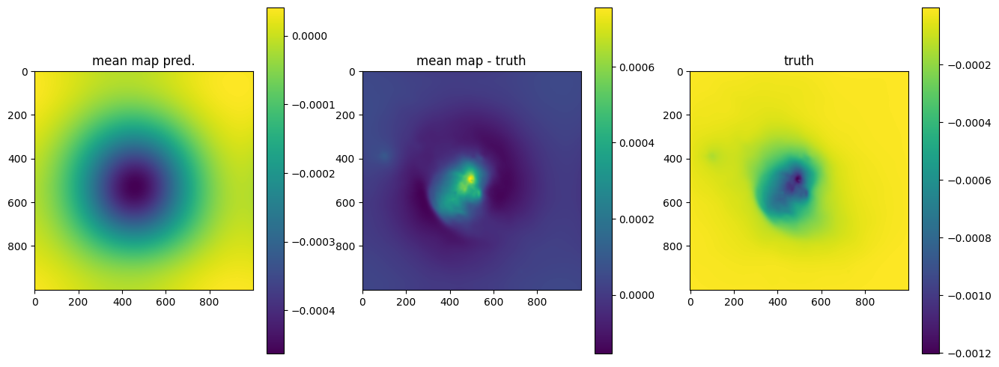

OPTIMIZE_KL: Starting 0010
SL: Iteration 0 ⛰:+3.2939e+07 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+8.2213e+05 Δ⛰:3.2117e+07 ➽:1.0320e+01
SL: Iteration 2 ⛰:-4.2229e+05 Δ⛰:1.2444e+06 ➽:1.0320e+01
SL: Iteration 3 ⛰:-4.4121e+05 Δ⛰:1.8919e+04 ➽:1.0320e+01
SL: Iteration 4 ⛰:-4.5725e+05 Δ⛰:1.6044e+04 ➽:1.0320e+01
SL: Iteration 5 ⛰:-4.7656e+05 Δ⛰:1.9305e+04 ➽:1.0320e+01
SL: Iteration 6 ⛰:-4.9343e+05 Δ⛰:1.6872e+04 ➽:1.0320e+01
SL: Iteration 7 ⛰:-4.9345e+05 Δ⛰:2.3021e+01 ➽:1.0320e+01
SL: Iteration 8 ⛰:-4.9695e+05 Δ⛰:3.5023e+03 ➽:1.0320e+01
SL: Iteration 9 ⛰:-5.0061e+05 Δ⛰:3.6602e+03 ➽:1.0320e+01
SL: Iteration 10 ⛰:-5.0329e+05 Δ⛰:2.6730e+03 ➽:1.0320e+01
SL: Iteration 11 ⛰:-5.0333e+05 Δ⛰:4.3786e+01 ➽:1.0320e+01
SL: Iteration 12 ⛰:-5.0593e+05 Δ⛰:2.6009e+03 ➽:1.0320e+01
SL: Iteration 13 ⛰:-5.0593e+05 Δ⛰:8.0434e-01 ➽:1.0320e+01
SL: Iteration 0 ⛰:+1.1522e+07 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:-1.8024e+05 Δ⛰:1.1702e+07 ➽:1.0320e+01
SL: Iteration 2 ⛰:-2.5533e+05 Δ⛰:7.5090e+04 ➽:1.0320e+01
SL: Iteration 

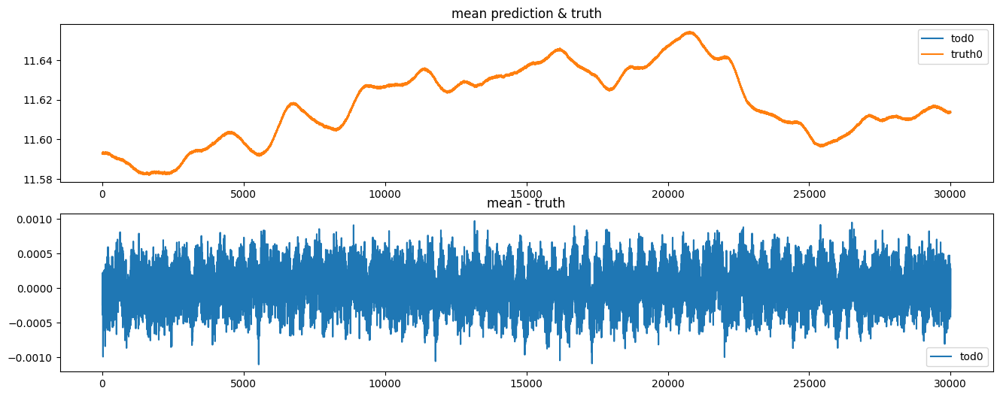

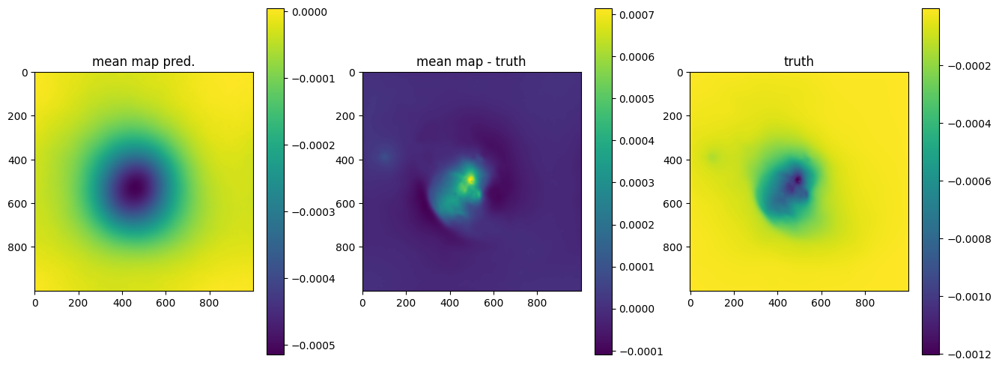

OPTIMIZE_KL: Starting 0011
SL: Iteration 0 ⛰:+2.1226e+07 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+2.4312e+06 Δ⛰:1.8795e+07 ➽:1.0320e+01
SL: Iteration 2 ⛰:+1.6542e+05 Δ⛰:2.2657e+06 ➽:1.0320e+01
SL: Iteration 3 ⛰:-3.1159e+05 Δ⛰:4.7700e+05 ➽:1.0320e+01
SL: Iteration 4 ⛰:-3.8321e+05 Δ⛰:7.1625e+04 ➽:1.0320e+01
SL: Iteration 5 ⛰:-4.7570e+05 Δ⛰:9.2488e+04 ➽:1.0320e+01
SL: Iteration 6 ⛰:-4.8918e+05 Δ⛰:1.3482e+04 ➽:1.0320e+01
SL: Iteration 7 ⛰:-4.8919e+05 Δ⛰:1.2614e+01 ➽:1.0320e+01
SL: Iteration 8 ⛰:-4.9572e+05 Δ⛰:6.5269e+03 ➽:1.0320e+01
SL: Iteration 9 ⛰:-4.9988e+05 Δ⛰:4.1641e+03 ➽:1.0320e+01
SL: Iteration 10 ⛰:-5.0116e+05 Δ⛰:1.2761e+03 ➽:1.0320e+01
SL: Iteration 11 ⛰:-5.0214e+05 Δ⛰:9.8154e+02 ➽:1.0320e+01
SL: Iteration 12 ⛰:-5.0505e+05 Δ⛰:2.9120e+03 ➽:1.0320e+01
SL: Iteration 13 ⛰:-5.0505e+05 Δ⛰:8.1550e-01 ➽:1.0320e+01
SL: Iteration 0 ⛰:+1.0628e+08 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+3.1178e+05 Δ⛰:1.0597e+08 ➽:1.0320e+01
SL: Iteration 2 ⛰:-2.4066e+05 Δ⛰:5.5244e+05 ➽:1.0320e+01
SL: Iteration 

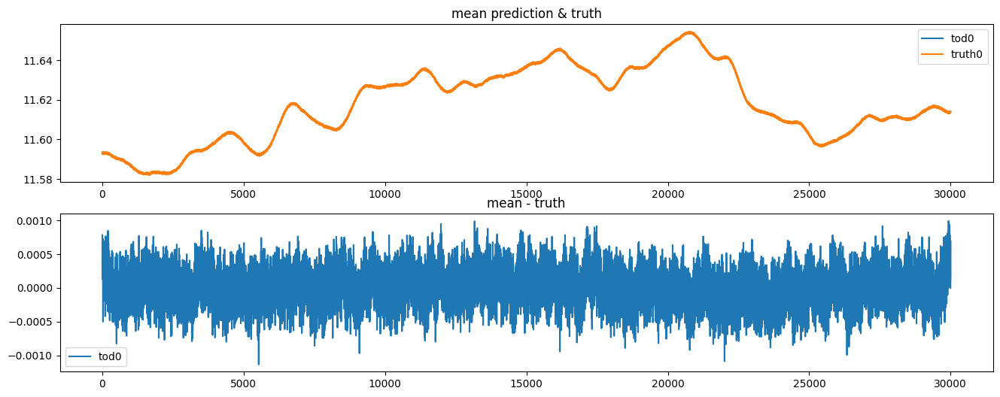

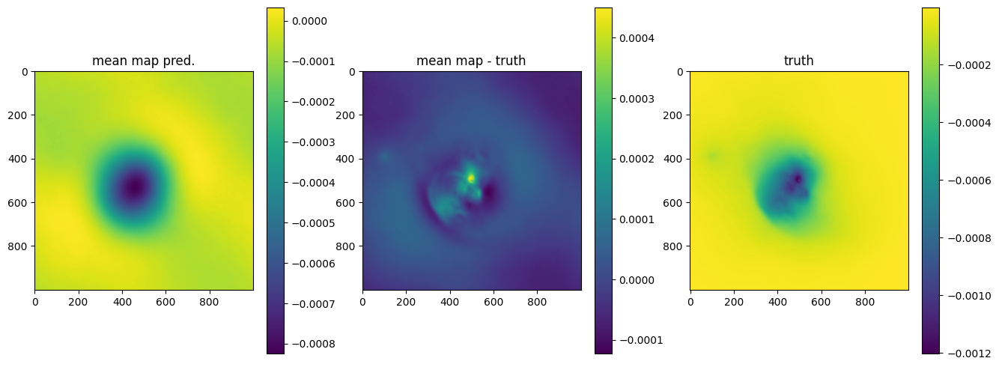

OPTIMIZE_KL: Starting 0012
SL: Iteration 0 ⛰:+2.0135e+07 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+2.0856e+05 Δ⛰:1.9926e+07 ➽:1.0320e+01
SL: Iteration 2 ⛰:-1.7194e+05 Δ⛰:3.8050e+05 ➽:1.0320e+01
SL: Iteration 3 ⛰:-2.9023e+05 Δ⛰:1.1829e+05 ➽:1.0320e+01
SL: Iteration 4 ⛰:-4.0883e+05 Δ⛰:1.1861e+05 ➽:1.0320e+01
SL: Iteration 5 ⛰:-4.6984e+05 Δ⛰:6.1003e+04 ➽:1.0320e+01
SL: Iteration 6 ⛰:-4.8618e+05 Δ⛰:1.6342e+04 ➽:1.0320e+01
SL: Iteration 7 ⛰:-4.8807e+05 Δ⛰:1.8911e+03 ➽:1.0320e+01
SL: Iteration 8 ⛰:-4.9312e+05 Δ⛰:5.0501e+03 ➽:1.0320e+01
SL: Iteration 9 ⛰:-4.9735e+05 Δ⛰:4.2305e+03 ➽:1.0320e+01
SL: Iteration 10 ⛰:-5.0316e+05 Δ⛰:5.8094e+03 ➽:1.0320e+01
SL: Iteration 11 ⛰:-5.0628e+05 Δ⛰:3.1164e+03 ➽:1.0320e+01
SL: Iteration 12 ⛰:-5.0633e+05 Δ⛰:5.6649e+01 ➽:1.0320e+01
SL: Iteration 13 ⛰:-5.0792e+05 Δ⛰:1.5833e+03 ➽:1.0320e+01
SL: Iteration 14 ⛰:-5.0840e+05 Δ⛰:4.8281e+02 ➽:1.0320e+01
SL: Iteration 15 ⛰:-5.0977e+05 Δ⛰:1.3743e+03 ➽:1.0320e+01
SL: Iteration 16 ⛰:-5.0981e+05 Δ⛰:3.6150e+01 ➽:1.0320e+01
SL: 

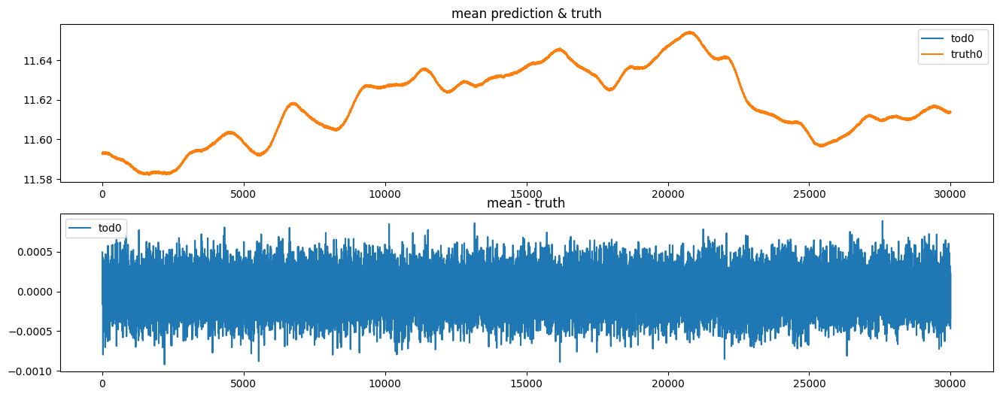

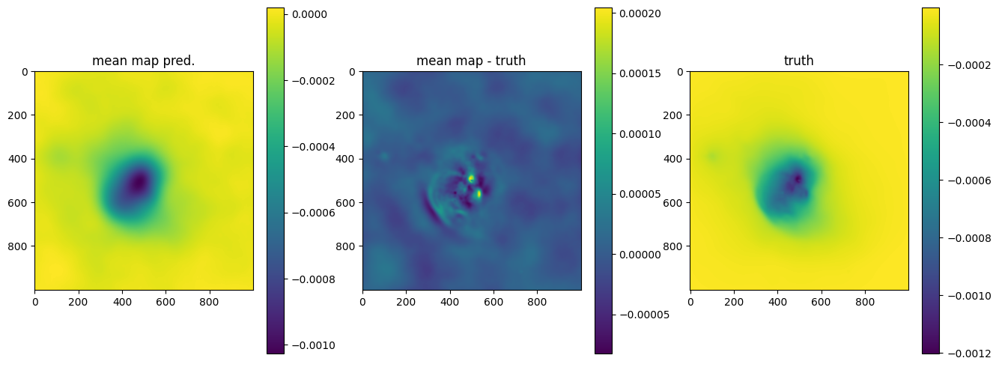

OPTIMIZE_KL: Starting 0013
SL: Iteration 0 ⛰:+3.6923e+05 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+2.7443e+05 Δ⛰:9.4801e+04 ➽:1.0320e+01
SL: Iteration 2 ⛰:+8.1208e+04 Δ⛰:1.9322e+05 ➽:1.0320e+01
SL: Iteration 3 ⛰:-2.8354e+05 Δ⛰:3.6475e+05 ➽:1.0320e+01
SL: Iteration 4 ⛰:-3.6389e+05 Δ⛰:8.0347e+04 ➽:1.0320e+01
SL: Iteration 5 ⛰:-4.1805e+05 Δ⛰:5.4158e+04 ➽:1.0320e+01
SL: Iteration 6 ⛰:-4.6308e+05 Δ⛰:4.5027e+04 ➽:1.0320e+01
SL: Iteration 7 ⛰:-4.8616e+05 Δ⛰:2.3081e+04 ➽:1.0320e+01
SL: Iteration 8 ⛰:-4.8617e+05 Δ⛰:1.7498e+01 ➽:1.0320e+01
SL: Iteration 9 ⛰:-4.9383e+05 Δ⛰:7.6605e+03 ➽:1.0320e+01
SL: Iteration 10 ⛰:-4.9935e+05 Δ⛰:5.5130e+03 ➽:1.0320e+01
SL: Iteration 11 ⛰:-4.9969e+05 Δ⛰:3.4195e+02 ➽:1.0320e+01
SL: Iteration 12 ⛰:-5.0572e+05 Δ⛰:6.0337e+03 ➽:1.0320e+01
SL: Iteration 13 ⛰:-5.0794e+05 Δ⛰:2.2151e+03 ➽:1.0320e+01
SL: Iteration 14 ⛰:-5.0794e+05 Δ⛰:1.1577e+00 ➽:1.0320e+01
SL: Iteration 0 ⛰:+1.5977e+08 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+1.4859e+06 Δ⛰:1.5828e+08 ➽:1.0320e+01
SL: Iteration

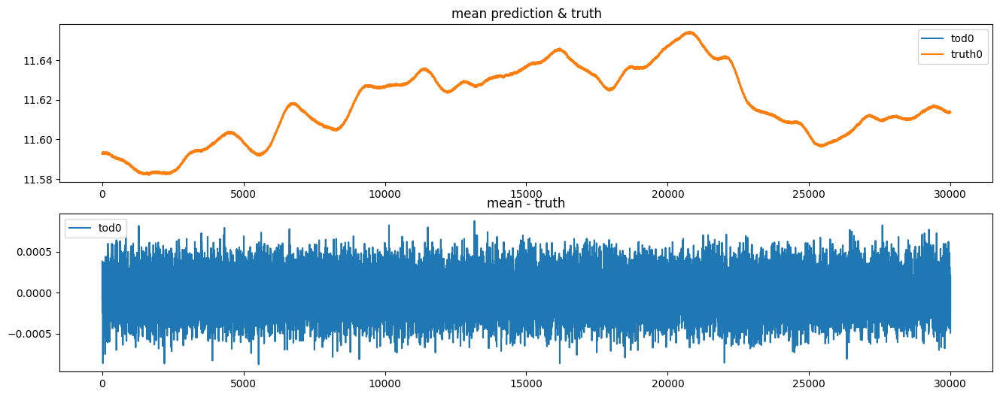

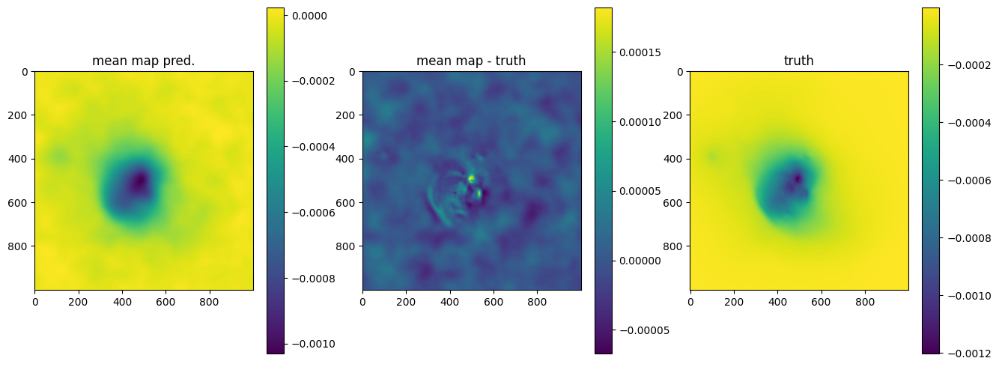

OPTIMIZE_KL: Starting 0014
SL: Iteration 0 ⛰:+3.1390e+07 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+1.5232e+06 Δ⛰:2.9866e+07 ➽:1.0320e+01
SL: Iteration 2 ⛰:-4.4088e+05 Δ⛰:1.9641e+06 ➽:1.0320e+01
SL: Iteration 3 ⛰:-4.5715e+05 Δ⛰:1.6277e+04 ➽:1.0320e+01
SL: Iteration 4 ⛰:-4.7012e+05 Δ⛰:1.2964e+04 ➽:1.0320e+01
SL: Iteration 5 ⛰:-4.8361e+05 Δ⛰:1.3495e+04 ➽:1.0320e+01
SL: Iteration 6 ⛰:-4.9355e+05 Δ⛰:9.9371e+03 ➽:1.0320e+01
SL: Iteration 7 ⛰:-4.9374e+05 Δ⛰:1.8718e+02 ➽:1.0320e+01
SL: Iteration 8 ⛰:-4.9949e+05 Δ⛰:5.7545e+03 ➽:1.0320e+01
SL: Iteration 9 ⛰:-5.0340e+05 Δ⛰:3.9066e+03 ➽:1.0320e+01
SL: Iteration 10 ⛰:-5.0478e+05 Δ⛰:1.3851e+03 ➽:1.0320e+01
SL: Iteration 11 ⛰:-5.0481e+05 Δ⛰:2.4497e+01 ➽:1.0320e+01
SL: Iteration 12 ⛰:-5.0850e+05 Δ⛰:3.6890e+03 ➽:1.0320e+01
SL: Iteration 13 ⛰:-5.0850e+05 Δ⛰:8.0835e-01 ➽:1.0320e+01
SL: Iteration 0 ⛰:+2.5996e+07 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+3.6802e+06 Δ⛰:2.2316e+07 ➽:1.0320e+01
SL: Iteration 2 ⛰:+4.1927e+04 Δ⛰:3.6383e+06 ➽:1.0320e+01
SL: Iteration 

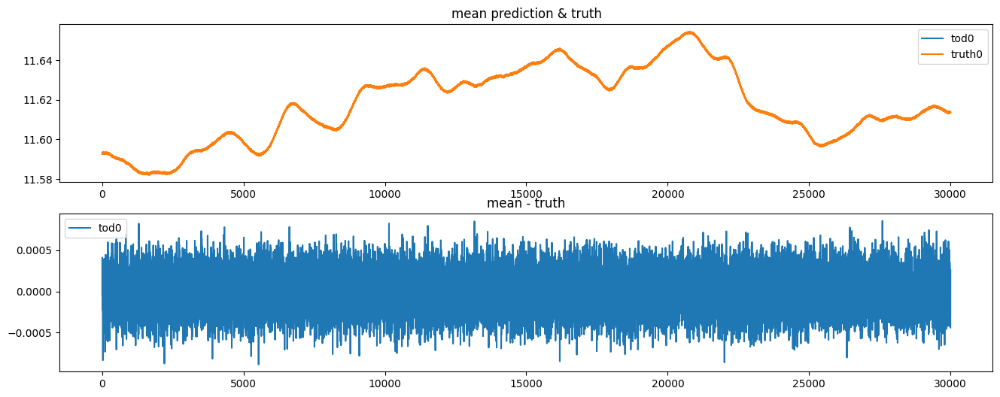

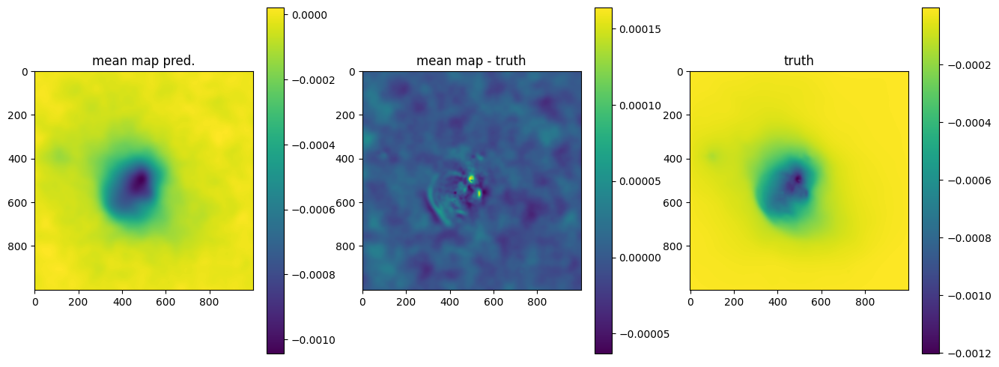

OPTIMIZE_KL: Starting 0015
SL: Iteration 0 ⛰:+1.4564e+06 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+4.7169e+05 Δ⛰:9.8468e+05 ➽:1.0320e+01
SL: Iteration 2 ⛰:-1.5492e+05 Δ⛰:6.2661e+05 ➽:1.0320e+01
SL: Iteration 3 ⛰:-3.2441e+05 Δ⛰:1.6948e+05 ➽:1.0320e+01
SL: Iteration 4 ⛰:-4.2536e+05 Δ⛰:1.0096e+05 ➽:1.0320e+01
SL: Iteration 5 ⛰:-4.5098e+05 Δ⛰:2.5617e+04 ➽:1.0320e+01
SL: Iteration 6 ⛰:-4.7563e+05 Δ⛰:2.4650e+04 ➽:1.0320e+01
SL: Iteration 7 ⛰:-4.9299e+05 Δ⛰:1.7359e+04 ➽:1.0320e+01
SL: Iteration 8 ⛰:-4.9300e+05 Δ⛰:8.7323e+00 ➽:1.0320e+01
SL: Iteration 0 ⛰:+5.6644e+05 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:-2.5875e+05 Δ⛰:8.2519e+05 ➽:1.0320e+01
SL: Iteration 2 ⛰:-3.6120e+05 Δ⛰:1.0245e+05 ➽:1.0320e+01
SL: Iteration 3 ⛰:-4.5002e+05 Δ⛰:8.8826e+04 ➽:1.0320e+01
SL: Iteration 4 ⛰:-4.6906e+05 Δ⛰:1.9042e+04 ➽:1.0320e+01
SL: Iteration 5 ⛰:-4.7832e+05 Δ⛰:9.2539e+03 ➽:1.0320e+01
SL: Iteration 6 ⛰:-4.9093e+05 Δ⛰:1.2608e+04 ➽:1.0320e+01
SL: Iteration 7 ⛰:-4.9554e+05 Δ⛰:4.6174e+03 ➽:1.0320e+01
SL: Iteration 8 ⛰:

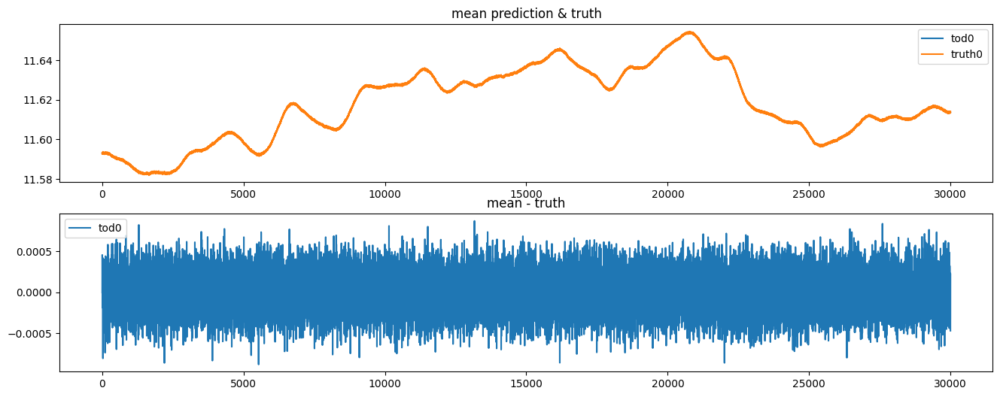

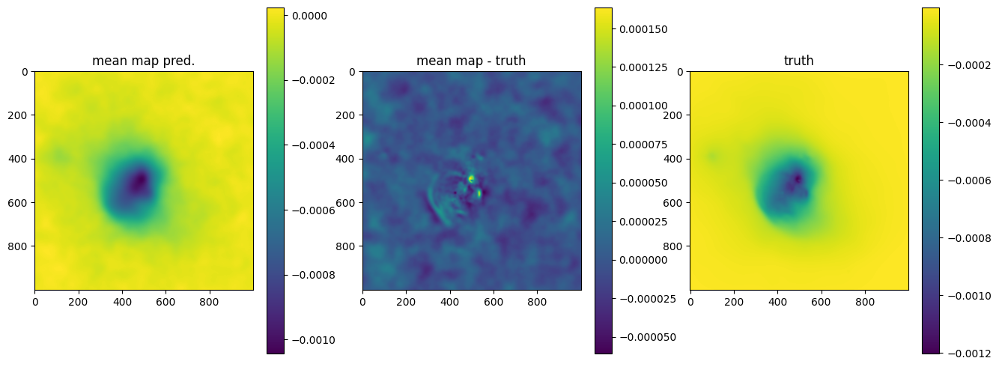

OPTIMIZE_KL: Starting 0016
SL: Iteration 0 ⛰:+9.7271e+06 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+1.7046e+06 Δ⛰:8.0226e+06 ➽:1.0320e+01
SL: Iteration 2 ⛰:-3.5761e+04 Δ⛰:1.7403e+06 ➽:1.0320e+01
SL: Iteration 3 ⛰:-3.5332e+05 Δ⛰:3.1756e+05 ➽:1.0320e+01
SL: Iteration 4 ⛰:-4.2529e+05 Δ⛰:7.1971e+04 ➽:1.0320e+01
SL: Iteration 5 ⛰:-4.6719e+05 Δ⛰:4.1898e+04 ➽:1.0320e+01
SL: Iteration 6 ⛰:-4.8247e+05 Δ⛰:1.5284e+04 ➽:1.0320e+01
SL: Iteration 7 ⛰:-4.9004e+05 Δ⛰:7.5693e+03 ➽:1.0320e+01
SL: Iteration 8 ⛰:-4.9039e+05 Δ⛰:3.5319e+02 ➽:1.0320e+01
SL: Iteration 9 ⛰:-5.0085e+05 Δ⛰:1.0456e+04 ➽:1.0320e+01
SL: Iteration 10 ⛰:-5.0219e+05 Δ⛰:1.3451e+03 ➽:1.0320e+01
SL: Iteration 11 ⛰:-5.0557e+05 Δ⛰:3.3794e+03 ➽:1.0320e+01
SL: Iteration 12 ⛰:-5.0603e+05 Δ⛰:4.5823e+02 ➽:1.0320e+01
SL: Iteration 13 ⛰:-5.0810e+05 Δ⛰:2.0674e+03 ➽:1.0320e+01
SL: Iteration 14 ⛰:-5.0819e+05 Δ⛰:9.0247e+01 ➽:1.0320e+01
SL: Iteration 15 ⛰:-5.0922e+05 Δ⛰:1.0311e+03 ➽:1.0320e+01
SL: Iteration 16 ⛰:-5.0932e+05 Δ⛰:9.9666e+01 ➽:1.0320e+01
SL: 

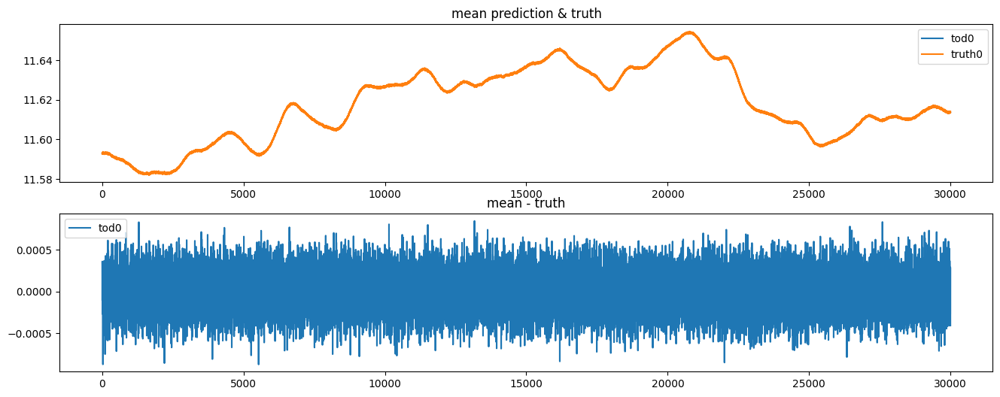

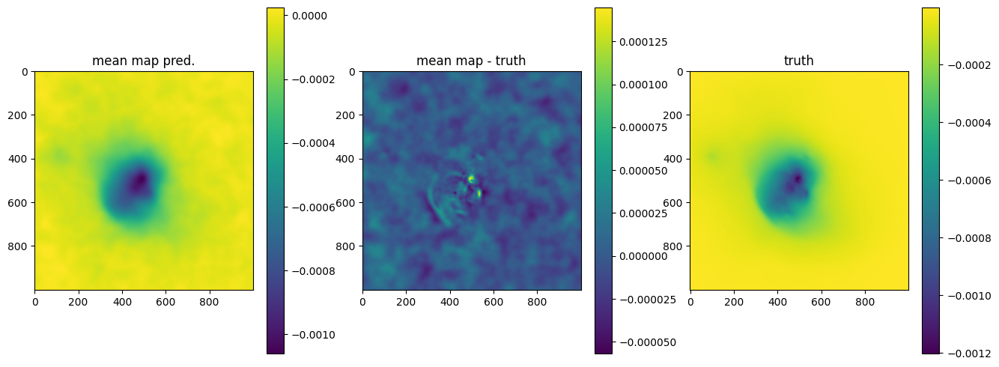

OPTIMIZE_KL: Starting 0017
SL: Iteration 0 ⛰:+1.0777e+08 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:-2.8938e+05 Δ⛰:1.0806e+08 ➽:1.0320e+01
SL: Iteration 2 ⛰:-3.3470e+05 Δ⛰:4.5315e+04 ➽:1.0320e+01
SL: Iteration 3 ⛰:-3.8984e+05 Δ⛰:5.5141e+04 ➽:1.0320e+01
SL: Iteration 4 ⛰:-4.5886e+05 Δ⛰:6.9020e+04 ➽:1.0320e+01
SL: Iteration 5 ⛰:-4.6882e+05 Δ⛰:9.9655e+03 ➽:1.0320e+01
SL: Iteration 6 ⛰:-4.8235e+05 Δ⛰:1.3523e+04 ➽:1.0320e+01
SL: Iteration 7 ⛰:-4.8414e+05 Δ⛰:1.7897e+03 ➽:1.0320e+01
SL: Iteration 8 ⛰:-4.9048e+05 Δ⛰:6.3445e+03 ➽:1.0320e+01
SL: Iteration 9 ⛰:-4.9643e+05 Δ⛰:5.9505e+03 ➽:1.0320e+01
SL: Iteration 10 ⛰:-5.0026e+05 Δ⛰:3.8274e+03 ➽:1.0320e+01
SL: Iteration 11 ⛰:-5.0237e+05 Δ⛰:2.1105e+03 ➽:1.0320e+01
SL: Iteration 12 ⛰:-5.0416e+05 Δ⛰:1.7919e+03 ➽:1.0320e+01
SL: Iteration 13 ⛰:-5.0426e+05 Δ⛰:1.0206e+02 ➽:1.0320e+01
SL: Iteration 14 ⛰:-5.0668e+05 Δ⛰:2.4118e+03 ➽:1.0320e+01
SL: Iteration 15 ⛰:-5.0780e+05 Δ⛰:1.1220e+03 ➽:1.0320e+01
SL: Iteration 16 ⛰:-5.0904e+05 Δ⛰:1.2439e+03 ➽:1.0320e+01
SL: 

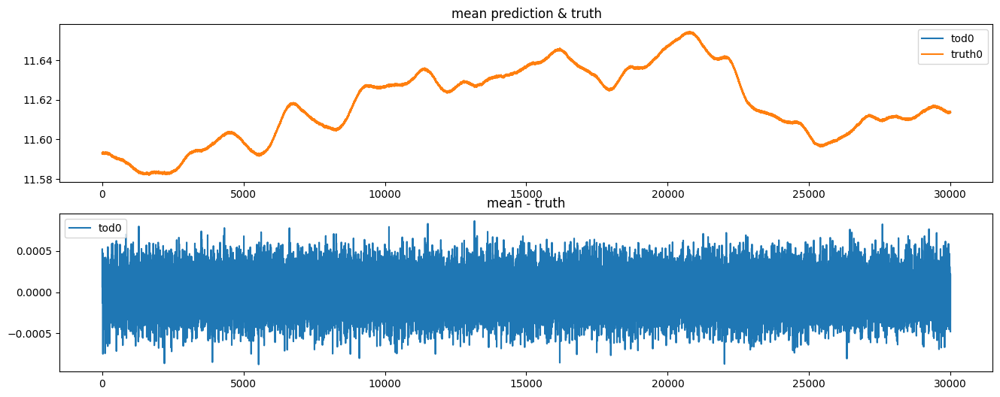

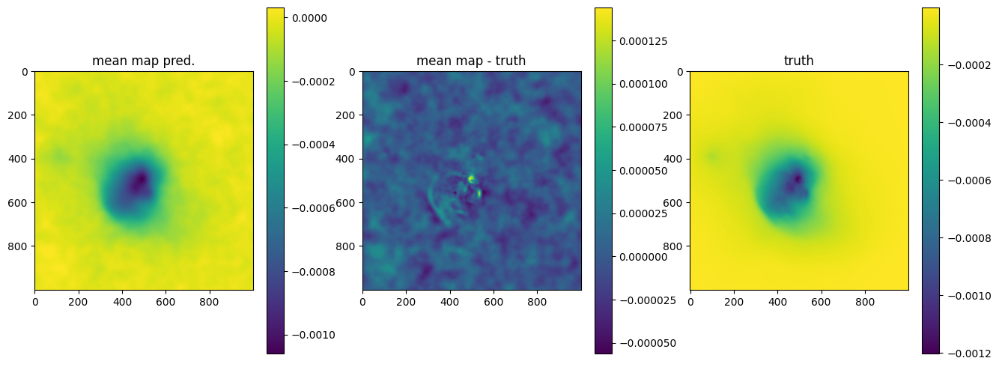

OPTIMIZE_KL: Starting 0018
SL: Iteration 0 ⛰:+9.2372e+06 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:-1.9828e+05 Δ⛰:9.4355e+06 ➽:1.0320e+01
SL: Iteration 2 ⛰:-2.6997e+05 Δ⛰:7.1696e+04 ➽:1.0320e+01
SL: Iteration 3 ⛰:-3.6629e+05 Δ⛰:9.6315e+04 ➽:1.0320e+01
SL: Iteration 4 ⛰:-4.1920e+05 Δ⛰:5.2917e+04 ➽:1.0320e+01
SL: Iteration 5 ⛰:-4.5675e+05 Δ⛰:3.7541e+04 ➽:1.0320e+01
SL: Iteration 6 ⛰:-4.6818e+05 Δ⛰:1.1434e+04 ➽:1.0320e+01
SL: Iteration 7 ⛰:-4.7658e+05 Δ⛰:8.3990e+03 ➽:1.0320e+01
SL: Iteration 8 ⛰:-4.8840e+05 Δ⛰:1.1819e+04 ➽:1.0320e+01
SL: Iteration 9 ⛰:-4.9437e+05 Δ⛰:5.9743e+03 ➽:1.0320e+01
SL: Iteration 10 ⛰:-5.0005e+05 Δ⛰:5.6730e+03 ➽:1.0320e+01
SL: Iteration 11 ⛰:-5.0096e+05 Δ⛰:9.1797e+02 ➽:1.0320e+01
SL: Iteration 12 ⛰:-5.0377e+05 Δ⛰:2.8105e+03 ➽:1.0320e+01
SL: Iteration 13 ⛰:-5.0397e+05 Δ⛰:1.9164e+02 ➽:1.0320e+01
SL: Iteration 14 ⛰:-5.0722e+05 Δ⛰:3.2554e+03 ➽:1.0320e+01
SL: Iteration 15 ⛰:-5.0872e+05 Δ⛰:1.5028e+03 ➽:1.0320e+01
SL: Iteration 16 ⛰:-5.0960e+05 Δ⛰:8.7212e+02 ➽:1.0320e+01
SL: 

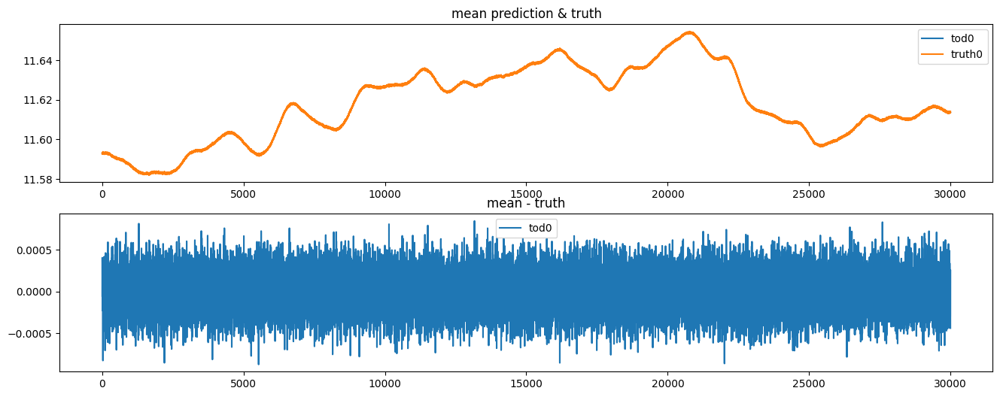

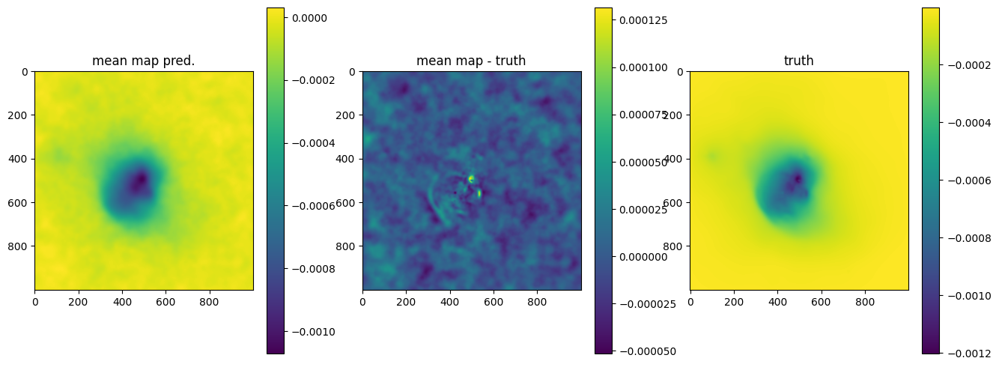

OPTIMIZE_KL: Starting 0019
SL: Iteration 0 ⛰:+4.4246e+06 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+5.7325e+05 Δ⛰:3.8513e+06 ➽:1.0320e+01
SL: Iteration 2 ⛰:-1.4869e+05 Δ⛰:7.2194e+05 ➽:1.0320e+01
SL: Iteration 3 ⛰:-3.3741e+05 Δ⛰:1.8872e+05 ➽:1.0320e+01
SL: Iteration 4 ⛰:-4.4227e+05 Δ⛰:1.0486e+05 ➽:1.0320e+01
SL: Iteration 5 ⛰:-4.6598e+05 Δ⛰:2.3710e+04 ➽:1.0320e+01
SL: Iteration 6 ⛰:-4.8905e+05 Δ⛰:2.3072e+04 ➽:1.0320e+01
SL: Iteration 7 ⛰:-4.9366e+05 Δ⛰:4.6091e+03 ➽:1.0320e+01
SL: Iteration 8 ⛰:-4.9375e+05 Δ⛰:9.0038e+01 ➽:1.0320e+01
SL: Iteration 9 ⛰:-4.9835e+05 Δ⛰:4.5987e+03 ➽:1.0320e+01
SL: Iteration 10 ⛰:-5.0287e+05 Δ⛰:4.5272e+03 ➽:1.0320e+01
SL: Iteration 11 ⛰:-5.0305e+05 Δ⛰:1.8021e+02 ➽:1.0320e+01
SL: Iteration 12 ⛰:-5.0458e+05 Δ⛰:1.5242e+03 ➽:1.0320e+01
SL: Iteration 13 ⛰:-5.0541e+05 Δ⛰:8.3408e+02 ➽:1.0320e+01
SL: Iteration 14 ⛰:-5.0541e+05 Δ⛰:1.6104e+00 ➽:1.0320e+01
SL: Iteration 0 ⛰:+1.4834e+06 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+8.4786e+04 Δ⛰:1.3986e+06 ➽:1.0320e+01
SL: Iteration

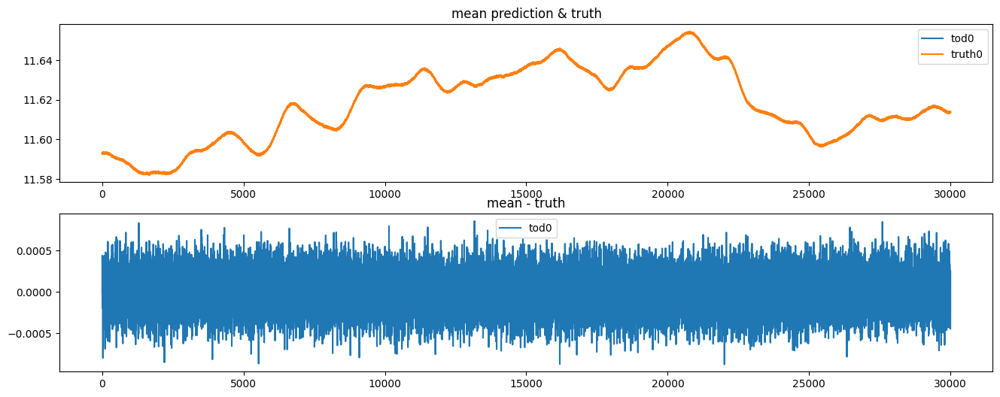

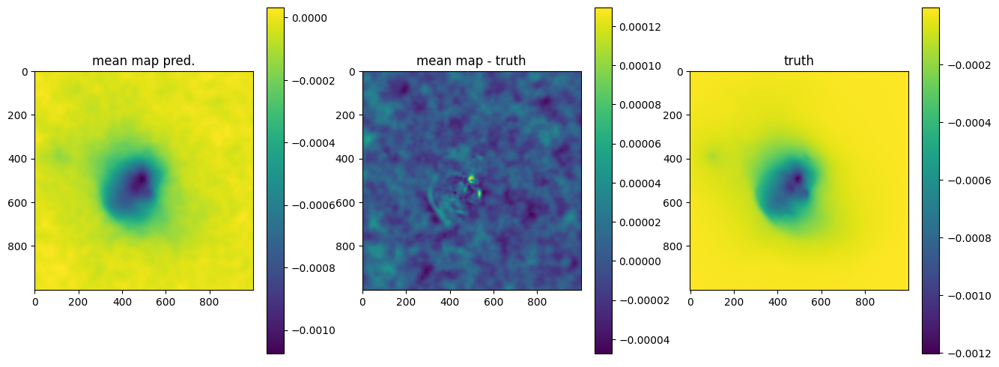

OPTIMIZE_KL: Starting 0020
SL: Iteration 0 ⛰:+1.1593e+06 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+4.4738e+05 Δ⛰:7.1194e+05 ➽:1.0320e+01
SL: Iteration 2 ⛰:+7.3423e+04 Δ⛰:3.7395e+05 ➽:1.0320e+01
SL: Iteration 3 ⛰:-2.5017e+05 Δ⛰:3.2359e+05 ➽:1.0320e+01
SL: Iteration 4 ⛰:-3.3026e+05 Δ⛰:8.0098e+04 ➽:1.0320e+01
SL: Iteration 5 ⛰:-4.4433e+05 Δ⛰:1.1407e+05 ➽:1.0320e+01
SL: Iteration 6 ⛰:-4.6199e+05 Δ⛰:1.7662e+04 ➽:1.0320e+01
SL: Iteration 7 ⛰:-4.7927e+05 Δ⛰:1.7276e+04 ➽:1.0320e+01
SL: Iteration 8 ⛰:-4.7931e+05 Δ⛰:4.1951e+01 ➽:1.0320e+01
SL: Iteration 9 ⛰:-4.9295e+05 Δ⛰:1.3640e+04 ➽:1.0320e+01
SL: Iteration 10 ⛰:-4.9964e+05 Δ⛰:6.6904e+03 ➽:1.0320e+01
SL: Iteration 11 ⛰:-5.0085e+05 Δ⛰:1.2101e+03 ➽:1.0320e+01
SL: Iteration 12 ⛰:-5.0260e+05 Δ⛰:1.7461e+03 ➽:1.0320e+01
SL: Iteration 13 ⛰:-5.0446e+05 Δ⛰:1.8590e+03 ➽:1.0320e+01
SL: Iteration 14 ⛰:-5.0446e+05 Δ⛰:4.3271e+00 ➽:1.0320e+01
SL: Iteration 0 ⛰:+1.6437e+06 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+6.8944e+05 Δ⛰:9.5421e+05 ➽:1.0320e+01
SL: Iteration

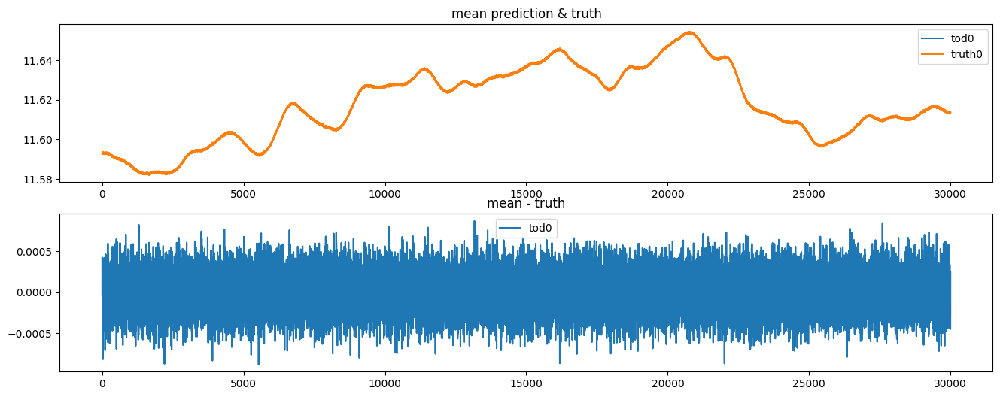

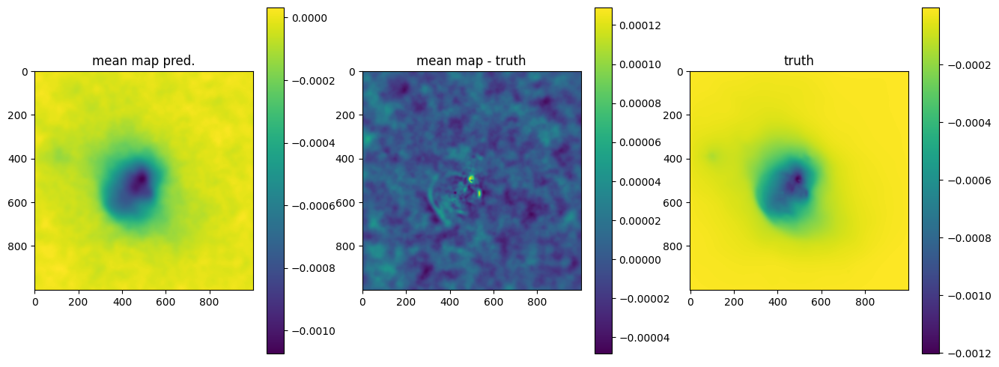

OPTIMIZE_KL: Starting 0021
SL: Iteration 0 ⛰:+6.7241e+06 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+4.4400e+05 Δ⛰:6.2801e+06 ➽:1.0320e+01
SL: Iteration 2 ⛰:-2.2884e+05 Δ⛰:6.7284e+05 ➽:1.0320e+01
SL: Iteration 3 ⛰:-3.0868e+05 Δ⛰:7.9842e+04 ➽:1.0320e+01
SL: Iteration 4 ⛰:-4.0849e+05 Δ⛰:9.9813e+04 ➽:1.0320e+01
SL: Iteration 5 ⛰:-4.6472e+05 Δ⛰:5.6222e+04 ➽:1.0320e+01
SL: Iteration 6 ⛰:-4.7305e+05 Δ⛰:8.3301e+03 ➽:1.0320e+01
SL: Iteration 7 ⛰:-4.8748e+05 Δ⛰:1.4436e+04 ➽:1.0320e+01
SL: Iteration 8 ⛰:-4.8810e+05 Δ⛰:6.1377e+02 ➽:1.0320e+01
SL: Iteration 9 ⛰:-4.9589e+05 Δ⛰:7.7984e+03 ➽:1.0320e+01
SL: Iteration 10 ⛰:-5.0202e+05 Δ⛰:6.1256e+03 ➽:1.0320e+01
SL: Iteration 11 ⛰:-5.0456e+05 Δ⛰:2.5390e+03 ➽:1.0320e+01
SL: Iteration 12 ⛰:-5.0477e+05 Δ⛰:2.1028e+02 ➽:1.0320e+01
SL: Iteration 13 ⛰:-5.0631e+05 Δ⛰:1.5366e+03 ➽:1.0320e+01
SL: Iteration 14 ⛰:-5.0673e+05 Δ⛰:4.2265e+02 ➽:1.0320e+01
SL: Iteration 15 ⛰:-5.0756e+05 Δ⛰:8.3249e+02 ➽:1.0320e+01
SL: Iteration 16 ⛰:-5.0961e+05 Δ⛰:2.0512e+03 ➽:1.0320e+01
SL: 

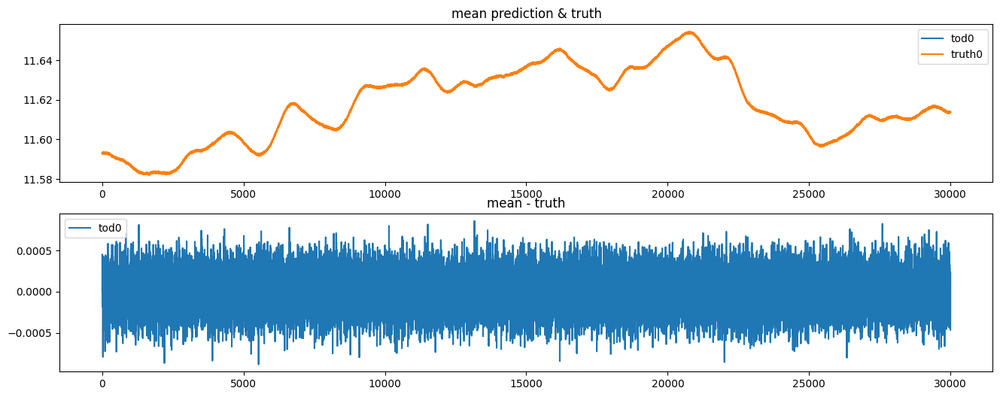

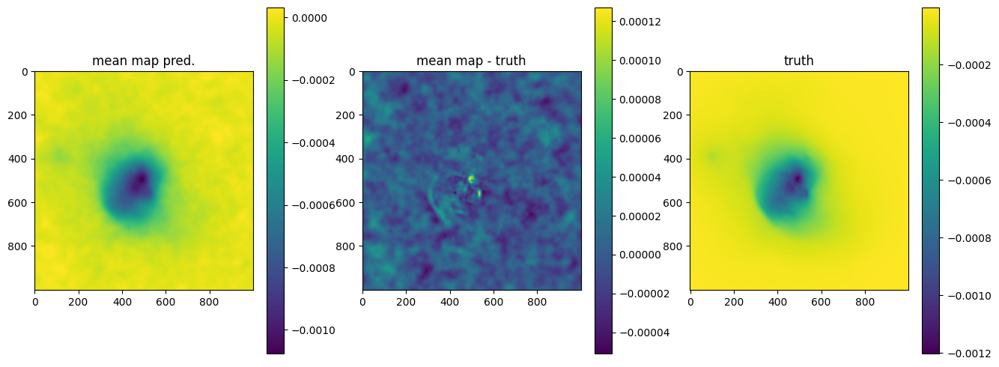

OPTIMIZE_KL: Starting 0022
SL: Iteration 0 ⛰:+6.3930e+07 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:-2.1275e+05 Δ⛰:6.4143e+07 ➽:1.0320e+01
SL: Iteration 2 ⛰:-2.6108e+05 Δ⛰:4.8325e+04 ➽:1.0320e+01
SL: Iteration 3 ⛰:-3.2392e+05 Δ⛰:6.2840e+04 ➽:1.0320e+01
SL: Iteration 4 ⛰:-4.4357e+05 Δ⛰:1.1965e+05 ➽:1.0320e+01
SL: Iteration 5 ⛰:-4.7130e+05 Δ⛰:2.7732e+04 ➽:1.0320e+01
SL: Iteration 6 ⛰:-4.7873e+05 Δ⛰:7.4218e+03 ➽:1.0320e+01
SL: Iteration 7 ⛰:-4.8732e+05 Δ⛰:8.5980e+03 ➽:1.0320e+01
SL: Iteration 8 ⛰:-4.9422e+05 Δ⛰:6.8990e+03 ➽:1.0320e+01
SL: Iteration 9 ⛰:-4.9899e+05 Δ⛰:4.7713e+03 ➽:1.0320e+01
SL: Iteration 10 ⛰:-5.0240e+05 Δ⛰:3.4013e+03 ➽:1.0320e+01
SL: Iteration 11 ⛰:-5.0509e+05 Δ⛰:2.6957e+03 ➽:1.0320e+01
SL: Iteration 12 ⛰:-5.0554e+05 Δ⛰:4.4423e+02 ➽:1.0320e+01
SL: Iteration 13 ⛰:-5.0634e+05 Δ⛰:8.0208e+02 ➽:1.0320e+01
SL: Iteration 14 ⛰:-5.0746e+05 Δ⛰:1.1262e+03 ➽:1.0320e+01
SL: Iteration 15 ⛰:-5.0830e+05 Δ⛰:8.3731e+02 ➽:1.0320e+01
SL: Iteration 16 ⛰:-5.0914e+05 Δ⛰:8.4346e+02 ➽:1.0320e+01
SL: 

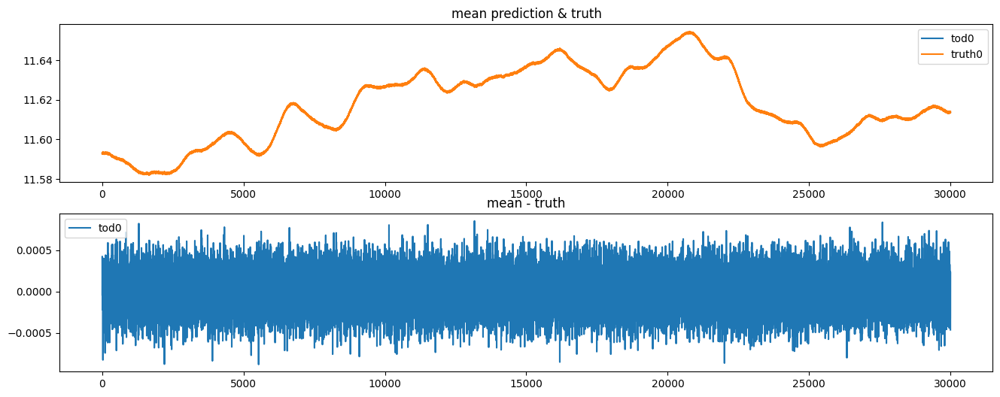

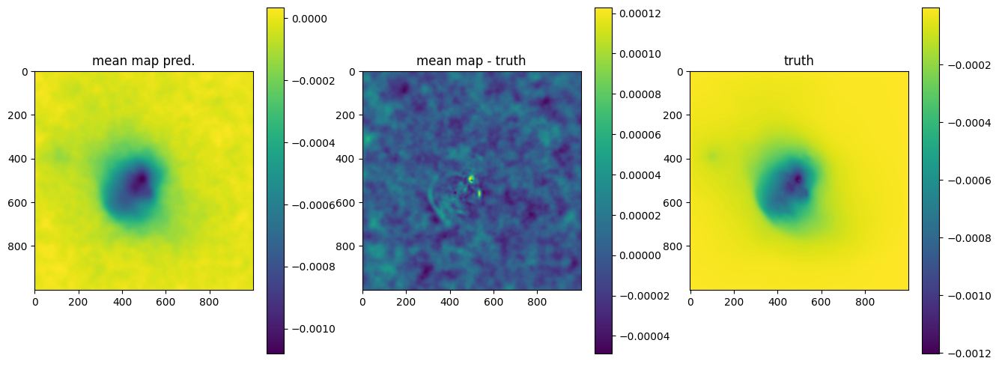

OPTIMIZE_KL: Starting 0023
SL: Iteration 0 ⛰:+4.6549e+07 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+6.8875e+06 Δ⛰:3.9661e+07 ➽:1.0320e+01
SL: Iteration 2 ⛰:+6.3810e+05 Δ⛰:6.2494e+06 ➽:1.0320e+01
SL: Iteration 3 ⛰:-2.2140e+05 Δ⛰:8.5950e+05 ➽:1.0320e+01
SL: Iteration 4 ⛰:-3.9568e+05 Δ⛰:1.7428e+05 ➽:1.0320e+01
SL: Iteration 5 ⛰:-4.3668e+05 Δ⛰:4.0999e+04 ➽:1.0320e+01
SL: Iteration 6 ⛰:-4.6103e+05 Δ⛰:2.4349e+04 ➽:1.0320e+01
SL: Iteration 7 ⛰:-4.8838e+05 Δ⛰:2.7347e+04 ➽:1.0320e+01
SL: Iteration 8 ⛰:-4.8922e+05 Δ⛰:8.4052e+02 ➽:1.0320e+01
SL: Iteration 9 ⛰:-4.9445e+05 Δ⛰:5.2304e+03 ➽:1.0320e+01
SL: Iteration 10 ⛰:-4.9846e+05 Δ⛰:4.0177e+03 ➽:1.0320e+01
SL: Iteration 11 ⛰:-4.9868e+05 Δ⛰:2.1330e+02 ➽:1.0320e+01
SL: Iteration 12 ⛰:-5.0221e+05 Δ⛰:3.5308e+03 ➽:1.0320e+01
SL: Iteration 13 ⛰:-5.0487e+05 Δ⛰:2.6665e+03 ➽:1.0320e+01
SL: Iteration 14 ⛰:-5.0494e+05 Δ⛰:6.1482e+01 ➽:1.0320e+01
SL: Iteration 15 ⛰:-5.0598e+05 Δ⛰:1.0480e+03 ➽:1.0320e+01
SL: Iteration 16 ⛰:-5.0679e+05 Δ⛰:8.0627e+02 ➽:1.0320e+01
SL: 

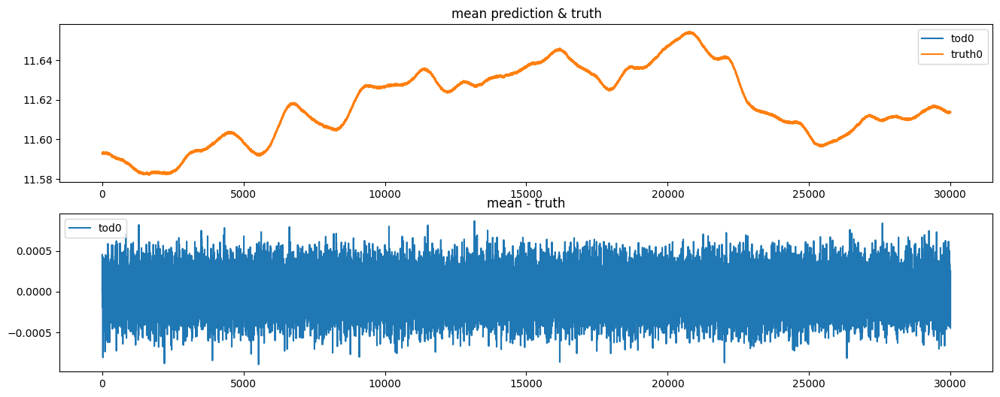

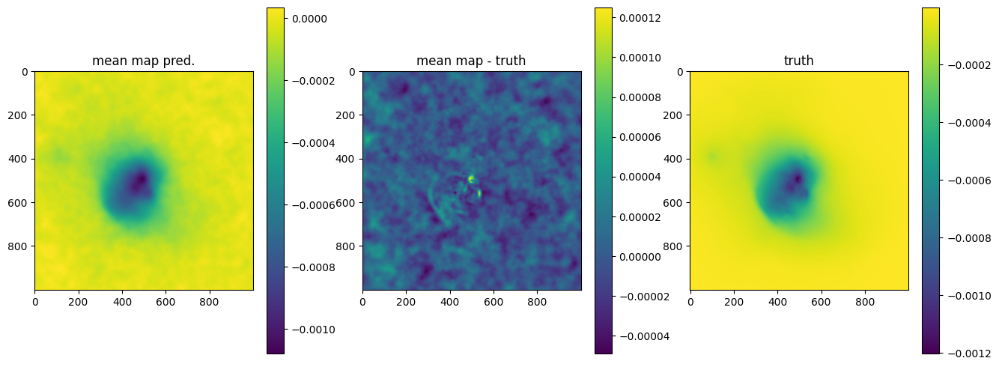

OPTIMIZE_KL: Starting 0024
SL: Iteration 0 ⛰:+7.2618e+07 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+7.3631e+05 Δ⛰:7.1881e+07 ➽:1.0320e+01
SL: Iteration 2 ⛰:-2.9061e+05 Δ⛰:1.0269e+06 ➽:1.0320e+01
SL: Iteration 3 ⛰:-4.3847e+05 Δ⛰:1.4786e+05 ➽:1.0320e+01
SL: Iteration 4 ⛰:-4.4996e+05 Δ⛰:1.1489e+04 ➽:1.0320e+01
SL: Iteration 5 ⛰:-4.7165e+05 Δ⛰:2.1686e+04 ➽:1.0320e+01
SL: Iteration 6 ⛰:-4.8245e+05 Δ⛰:1.0796e+04 ➽:1.0320e+01
SL: Iteration 7 ⛰:-4.8790e+05 Δ⛰:5.4560e+03 ➽:1.0320e+01
SL: Iteration 8 ⛰:-4.9070e+05 Δ⛰:2.8011e+03 ➽:1.0320e+01
SL: Iteration 9 ⛰:-4.9594e+05 Δ⛰:5.2339e+03 ➽:1.0320e+01
SL: Iteration 10 ⛰:-4.9746e+05 Δ⛰:1.5253e+03 ➽:1.0320e+01
SL: Iteration 11 ⛰:-4.9771e+05 Δ⛰:2.4468e+02 ➽:1.0320e+01
SL: Iteration 12 ⛰:-5.0110e+05 Δ⛰:3.3901e+03 ➽:1.0320e+01
SL: Iteration 13 ⛰:-5.0482e+05 Δ⛰:3.7255e+03 ➽:1.0320e+01
SL: Iteration 14 ⛰:-5.0482e+05 Δ⛰:1.1257e+00 ➽:1.0320e+01
SL: Iteration 0 ⛰:+1.3267e+07 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+6.0327e+06 Δ⛰:7.2343e+06 ➽:1.0320e+01
SL: Iteration

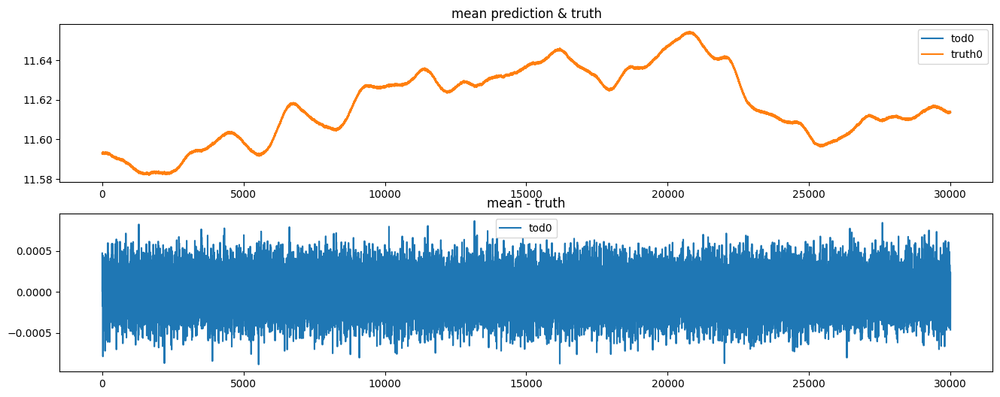

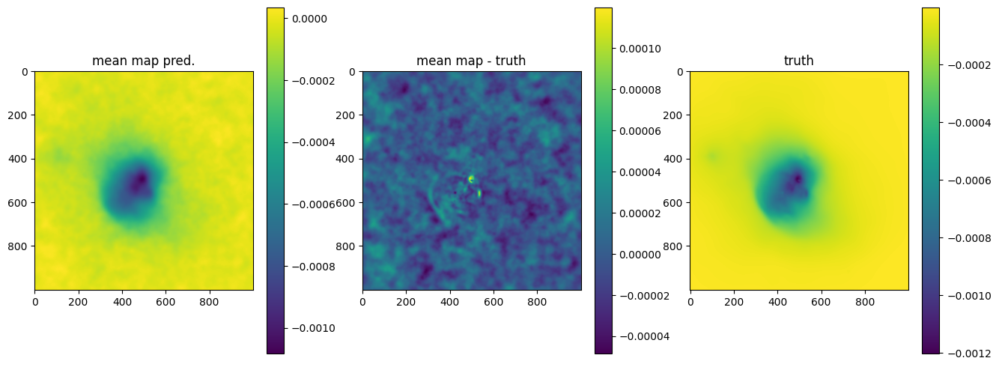

OPTIMIZE_KL: Starting 0025
SL: Iteration 0 ⛰:+9.4759e+07 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+6.9961e+05 Δ⛰:9.4059e+07 ➽:1.0320e+01
SL: Iteration 2 ⛰:+2.4754e+05 Δ⛰:4.5207e+05 ➽:1.0320e+01
SL: Iteration 3 ⛰:-2.6762e+05 Δ⛰:5.1517e+05 ➽:1.0320e+01
SL: Iteration 4 ⛰:-3.5516e+05 Δ⛰:8.7531e+04 ➽:1.0320e+01
SL: Iteration 5 ⛰:-4.3189e+05 Δ⛰:7.6736e+04 ➽:1.0320e+01
SL: Iteration 6 ⛰:-4.6239e+05 Δ⛰:3.0498e+04 ➽:1.0320e+01
SL: Iteration 7 ⛰:-4.8340e+05 Δ⛰:2.1006e+04 ➽:1.0320e+01
SL: Iteration 8 ⛰:-4.8346e+05 Δ⛰:6.7207e+01 ➽:1.0320e+01
SL: Iteration 9 ⛰:-4.9387e+05 Δ⛰:1.0402e+04 ➽:1.0320e+01
SL: Iteration 10 ⛰:-4.9913e+05 Δ⛰:5.2660e+03 ➽:1.0320e+01
SL: Iteration 11 ⛰:-5.0315e+05 Δ⛰:4.0196e+03 ➽:1.0320e+01
SL: Iteration 12 ⛰:-5.0318e+05 Δ⛰:2.4773e+01 ➽:1.0320e+01
SL: Iteration 13 ⛰:-5.0502e+05 Δ⛰:1.8401e+03 ➽:1.0320e+01
SL: Iteration 14 ⛰:-5.0502e+05 Δ⛰:1.7363e+00 ➽:1.0320e+01
SL: Iteration 0 ⛰:+3.5052e+07 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+2.0290e+06 Δ⛰:3.3023e+07 ➽:1.0320e+01
SL: Iteration

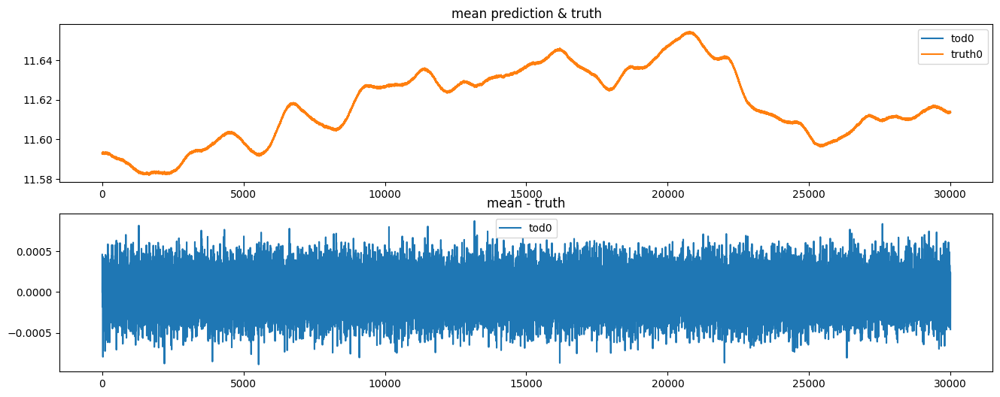

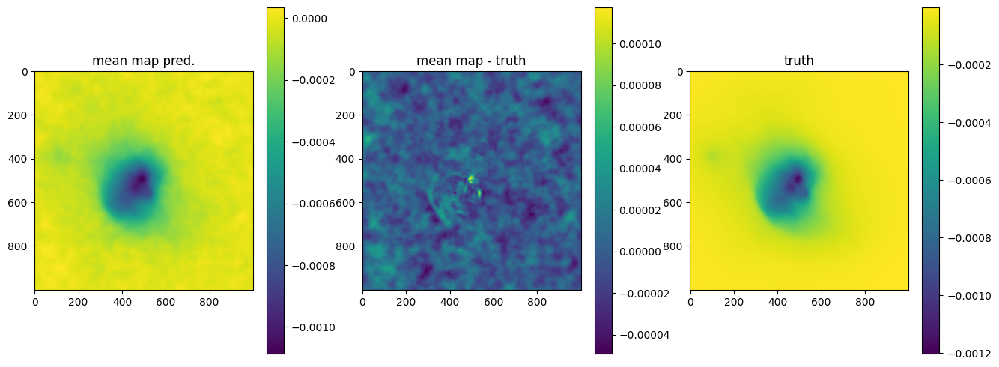

OPTIMIZE_KL: Starting 0026
SL: Iteration 0 ⛰:+1.2809e+08 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+3.8478e+05 Δ⛰:1.2771e+08 ➽:1.0320e+01
SL: Iteration 2 ⛰:-1.7236e+05 Δ⛰:5.5714e+05 ➽:1.0320e+01
SL: Iteration 3 ⛰:-3.9563e+05 Δ⛰:2.2327e+05 ➽:1.0320e+01
SL: Iteration 4 ⛰:-4.1933e+05 Δ⛰:2.3701e+04 ➽:1.0320e+01
SL: Iteration 5 ⛰:-4.4849e+05 Δ⛰:2.9162e+04 ➽:1.0320e+01
SL: Iteration 6 ⛰:-4.8182e+05 Δ⛰:3.3331e+04 ➽:1.0320e+01
SL: Iteration 7 ⛰:-4.8698e+05 Δ⛰:5.1552e+03 ➽:1.0320e+01
SL: Iteration 8 ⛰:-4.9172e+05 Δ⛰:4.7446e+03 ➽:1.0320e+01
SL: Iteration 9 ⛰:-4.9832e+05 Δ⛰:6.6024e+03 ➽:1.0320e+01
SL: Iteration 10 ⛰:-5.0004e+05 Δ⛰:1.7106e+03 ➽:1.0320e+01
SL: Iteration 11 ⛰:-5.0149e+05 Δ⛰:1.4543e+03 ➽:1.0320e+01
SL: Iteration 12 ⛰:-5.0536e+05 Δ⛰:3.8716e+03 ➽:1.0320e+01
SL: Iteration 13 ⛰:-5.0575e+05 Δ⛰:3.8639e+02 ➽:1.0320e+01
SL: Iteration 14 ⛰:-5.0763e+05 Δ⛰:1.8856e+03 ➽:1.0320e+01
SL: Iteration 15 ⛰:-5.0875e+05 Δ⛰:1.1199e+03 ➽:1.0320e+01
SL: Iteration 16 ⛰:-5.0999e+05 Δ⛰:1.2350e+03 ➽:1.0320e+01
SL: 

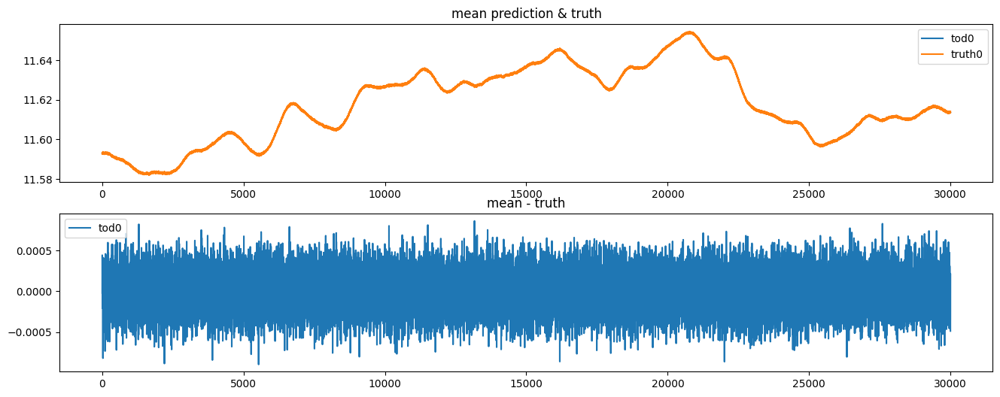

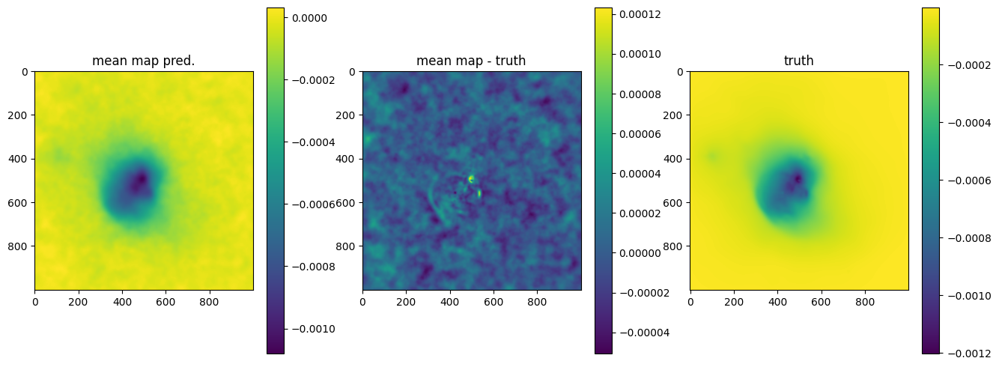

OPTIMIZE_KL: Starting 0027
SL: Iteration 0 ⛰:+1.3288e+08 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+7.1297e+06 Δ⛰:1.2575e+08 ➽:1.0320e+01
SL: Iteration 2 ⛰:-3.8770e+05 Δ⛰:7.5174e+06 ➽:1.0320e+01
SL: Iteration 3 ⛰:-4.6481e+05 Δ⛰:7.7115e+04 ➽:1.0320e+01
SL: Iteration 4 ⛰:-4.7787e+05 Δ⛰:1.3055e+04 ➽:1.0320e+01
SL: Iteration 5 ⛰:-4.8217e+05 Δ⛰:4.3056e+03 ➽:1.0320e+01
SL: Iteration 6 ⛰:-4.8607e+05 Δ⛰:3.8987e+03 ➽:1.0320e+01
SL: Iteration 7 ⛰:-4.8711e+05 Δ⛰:1.0415e+03 ➽:1.0320e+01
SL: Iteration 8 ⛰:-4.9757e+05 Δ⛰:1.0455e+04 ➽:1.0320e+01
SL: Iteration 9 ⛰:-5.0014e+05 Δ⛰:2.5714e+03 ➽:1.0320e+01
SL: Iteration 10 ⛰:-5.0153e+05 Δ⛰:1.3945e+03 ➽:1.0320e+01
SL: Iteration 11 ⛰:-5.0156e+05 Δ⛰:2.5845e+01 ➽:1.0320e+01
SL: Iteration 12 ⛰:-5.0404e+05 Δ⛰:2.4864e+03 ➽:1.0320e+01
SL: Iteration 13 ⛰:-5.0438e+05 Δ⛰:3.3759e+02 ➽:1.0320e+01
SL: Iteration 14 ⛰:-5.0618e+05 Δ⛰:1.7952e+03 ➽:1.0320e+01
SL: Iteration 15 ⛰:-5.0703e+05 Δ⛰:8.5726e+02 ➽:1.0320e+01
SL: Iteration 16 ⛰:-5.0799e+05 Δ⛰:9.5452e+02 ➽:1.0320e+01
SL: 

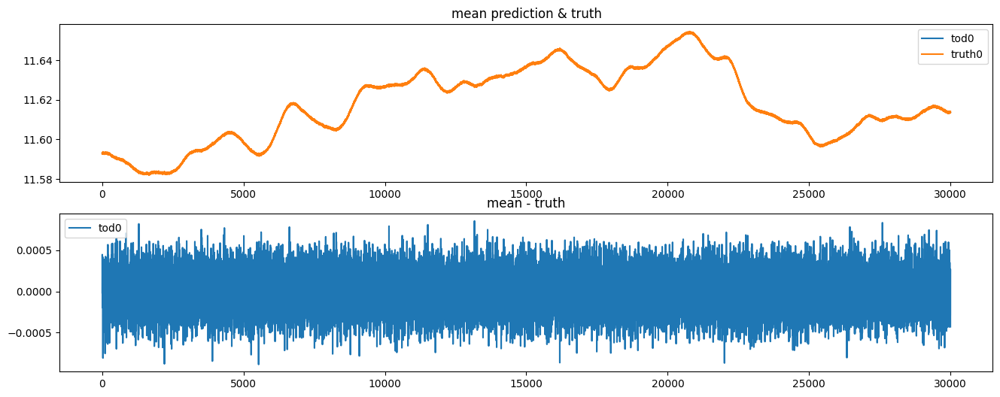

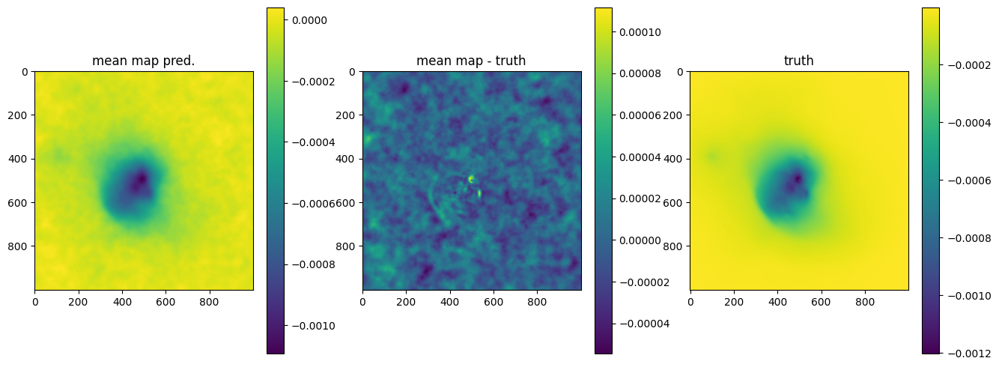

OPTIMIZE_KL: Starting 0028
SL: Iteration 0 ⛰:+6.2042e+06 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+2.5352e+06 Δ⛰:3.6691e+06 ➽:1.0320e+01
SL: Iteration 2 ⛰:-1.8394e+05 Δ⛰:2.7191e+06 ➽:1.0320e+01
SL: Iteration 3 ⛰:-3.9169e+05 Δ⛰:2.0776e+05 ➽:1.0320e+01
SL: Iteration 4 ⛰:-4.3182e+05 Δ⛰:4.0122e+04 ➽:1.0320e+01
SL: Iteration 5 ⛰:-4.5039e+05 Δ⛰:1.8573e+04 ➽:1.0320e+01
SL: Iteration 6 ⛰:-4.7265e+05 Δ⛰:2.2262e+04 ➽:1.0320e+01
SL: Iteration 7 ⛰:-4.8602e+05 Δ⛰:1.3364e+04 ➽:1.0320e+01
SL: Iteration 8 ⛰:-4.8681e+05 Δ⛰:7.9172e+02 ➽:1.0320e+01
SL: Iteration 9 ⛰:-4.9561e+05 Δ⛰:8.8052e+03 ➽:1.0320e+01
SL: Iteration 10 ⛰:-4.9732e+05 Δ⛰:1.7104e+03 ➽:1.0320e+01
SL: Iteration 11 ⛰:-5.0026e+05 Δ⛰:2.9394e+03 ➽:1.0320e+01
SL: Iteration 12 ⛰:-5.0107e+05 Δ⛰:8.0935e+02 ➽:1.0320e+01
SL: Iteration 13 ⛰:-5.0423e+05 Δ⛰:3.1589e+03 ➽:1.0320e+01
SL: Iteration 14 ⛰:-5.0425e+05 Δ⛰:2.3145e+01 ➽:1.0320e+01
SL: Iteration 15 ⛰:-5.0558e+05 Δ⛰:1.3263e+03 ➽:1.0320e+01
SL: Iteration 16 ⛰:-5.0709e+05 Δ⛰:1.5138e+03 ➽:1.0320e+01
SL: 

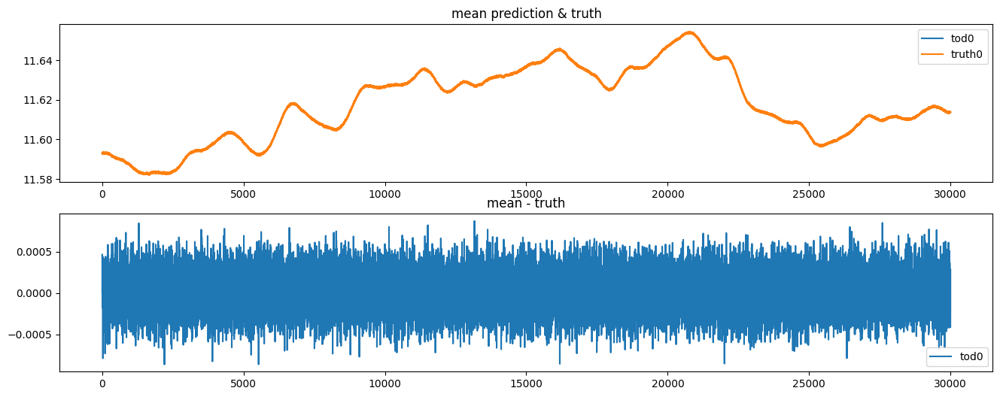

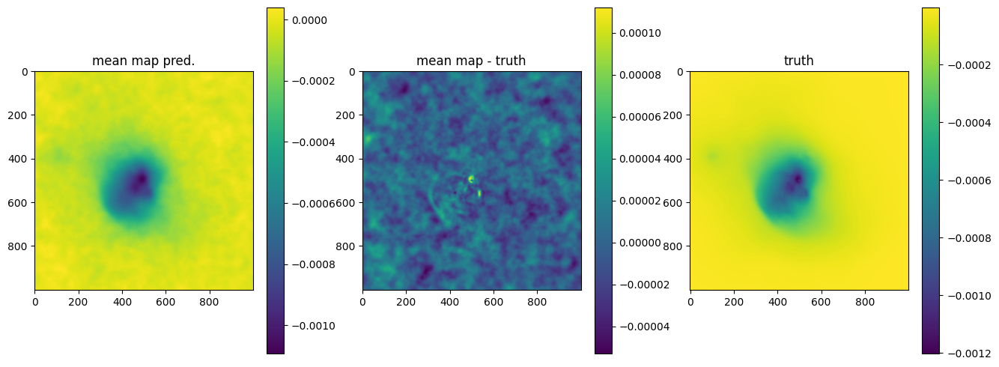

OPTIMIZE_KL: Starting 0029
SL: Iteration 0 ⛰:+5.6779e+06 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+2.1549e+06 Δ⛰:3.5230e+06 ➽:1.0320e+01
SL: Iteration 2 ⛰:+3.4851e+05 Δ⛰:1.8064e+06 ➽:1.0320e+01
SL: Iteration 3 ⛰:-1.9458e+05 Δ⛰:5.4309e+05 ➽:1.0320e+01
SL: Iteration 4 ⛰:-3.6053e+05 Δ⛰:1.6595e+05 ➽:1.0320e+01
SL: Iteration 5 ⛰:-4.6654e+05 Δ⛰:1.0601e+05 ➽:1.0320e+01
SL: Iteration 6 ⛰:-4.7021e+05 Δ⛰:3.6713e+03 ➽:1.0320e+01
SL: Iteration 7 ⛰:-4.8248e+05 Δ⛰:1.2273e+04 ➽:1.0320e+01
SL: Iteration 8 ⛰:-4.8302e+05 Δ⛰:5.3824e+02 ➽:1.0320e+01
SL: Iteration 9 ⛰:-4.8931e+05 Δ⛰:6.2847e+03 ➽:1.0320e+01
SL: Iteration 10 ⛰:-4.9279e+05 Δ⛰:3.4829e+03 ➽:1.0320e+01
SL: Iteration 11 ⛰:-4.9494e+05 Δ⛰:2.1525e+03 ➽:1.0320e+01
SL: Iteration 12 ⛰:-4.9796e+05 Δ⛰:3.0223e+03 ➽:1.0320e+01
SL: Iteration 13 ⛰:-5.0278e+05 Δ⛰:4.8181e+03 ➽:1.0320e+01
SL: Iteration 14 ⛰:-5.0312e+05 Δ⛰:3.3512e+02 ➽:1.0320e+01
SL: Iteration 15 ⛰:-5.0529e+05 Δ⛰:2.1686e+03 ➽:1.0320e+01
SL: Iteration 16 ⛰:-5.0625e+05 Δ⛰:9.6786e+02 ➽:1.0320e+01
SL: 

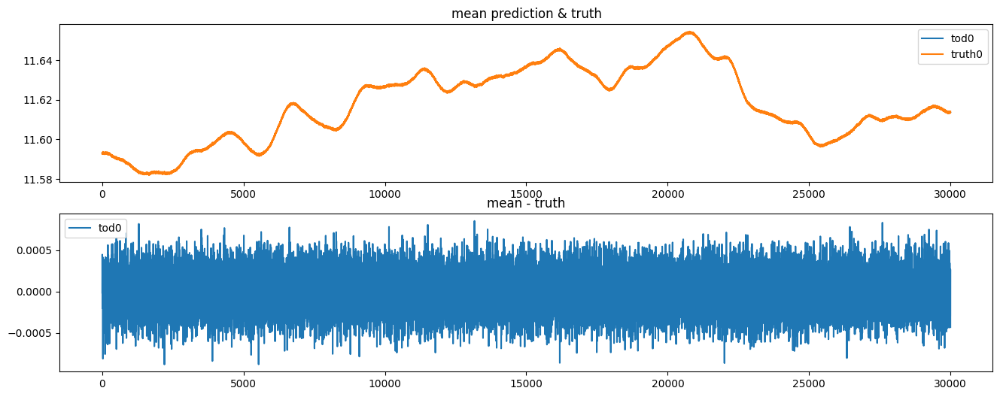

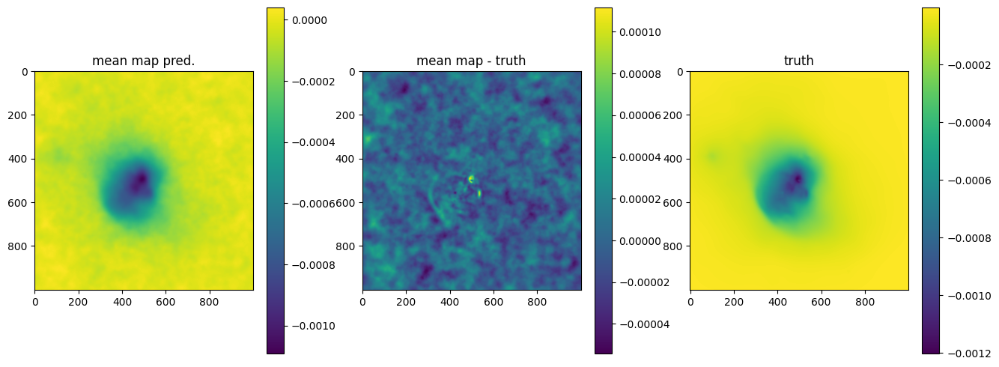

OPTIMIZE_KL: Starting 0030
SL: Iteration 0 ⛰:+9.4321e+05 Δ⛰:inf ➽:1.0320e+01
SL: Iteration 1 ⛰:+5.4814e+05 Δ⛰:3.9506e+05 ➽:1.0320e+01
SL: Iteration 2 ⛰:-2.5077e+05 Δ⛰:7.9892e+05 ➽:1.0320e+01
SL: Iteration 3 ⛰:-3.8425e+05 Δ⛰:1.3348e+05 ➽:1.0320e+01
SL: Iteration 4 ⛰:-4.4527e+05 Δ⛰:6.1020e+04 ➽:1.0320e+01
SL: Iteration 5 ⛰:-4.6984e+05 Δ⛰:2.4563e+04 ➽:1.0320e+01
SL: Iteration 6 ⛰:-4.7917e+05 Δ⛰:9.3373e+03 ➽:1.0320e+01
SL: Iteration 7 ⛰:-4.9319e+05 Δ⛰:1.4011e+04 ➽:1.0320e+01
SL: Iteration 8 ⛰:-4.9326e+05 Δ⛰:7.2441e+01 ➽:1.0320e+01
SL: Iteration 9 ⛰:-4.9643e+05 Δ⛰:3.1763e+03 ➽:1.0320e+01
SL: Iteration 10 ⛰:-5.0051e+05 Δ⛰:4.0783e+03 ➽:1.0320e+01
SL: Iteration 11 ⛰:-5.0088e+05 Δ⛰:3.7017e+02 ➽:1.0320e+01
SL: Iteration 12 ⛰:-5.0363e+05 Δ⛰:2.7513e+03 ➽:1.0320e+01
SL: Iteration 13 ⛰:-5.0603e+05 Δ⛰:2.3948e+03 ➽:1.0320e+01
SL: Iteration 14 ⛰:-5.0620e+05 Δ⛰:1.7437e+02 ➽:1.0320e+01
SL: Iteration 15 ⛰:-5.0703e+05 Δ⛰:8.2340e+02 ➽:1.0320e+01
SL: Iteration 16 ⛰:-5.0861e+05 Δ⛰:1.5884e+03 ➽:1.0320e+01
SL: 

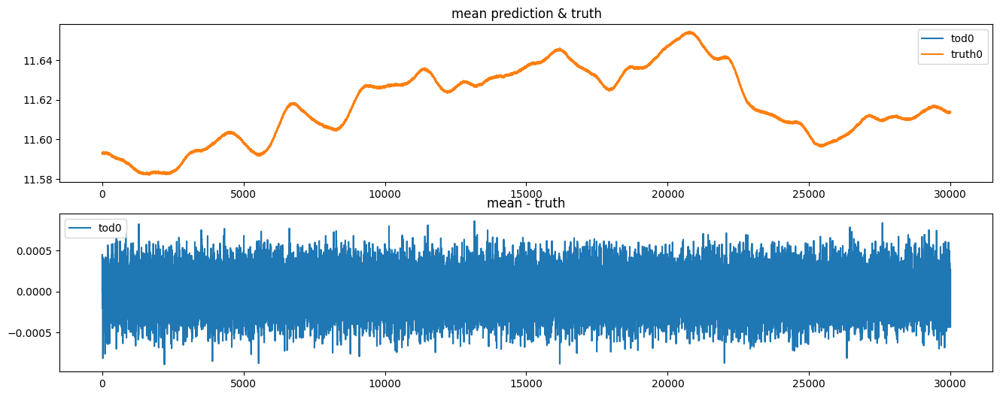

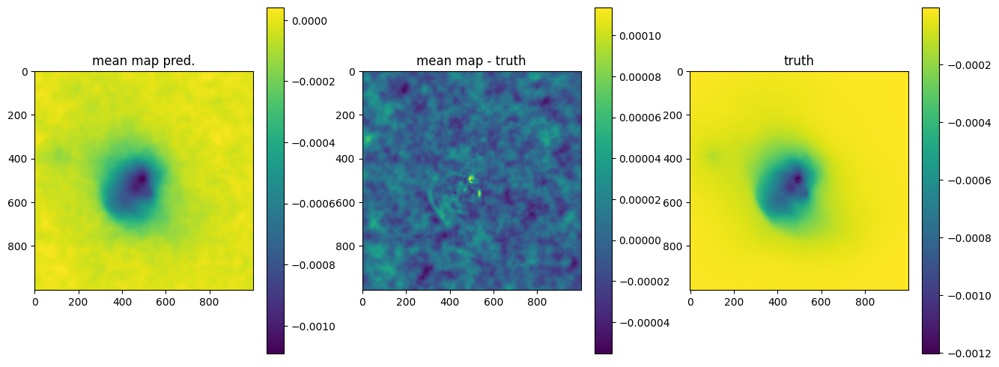

In [24]:
n_it = 30
# n_it = 40
# delta = 1e-4 # default
# delta = 1e-8 # map
# tod
# if noiselevel == 0.0: delta = 1e-6
if noiselevel == 0.0: delta = 1e-4
# if noiselevel == 0.0: delta = 1e-11
elif noiselevel == 0.1: delta = 1e-10
elif noiselevel == 0.5: delta = 1e-10
elif noiselevel == 1.0: delta = 1e-4
n_samples = 4 # no samples -> maximum aposteriory posterior

key, k_i, k_o = random.split(key, 3)

# callback fn for plotting during optimisation:
def callback(samples, opt_state):
    mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

    fig_tods, axes_tods = plt.subplots(2, 1, figsize=(16, 6))

    # for i in range(0, mean.shape[0], mean.shape[0]//10):
    for i in range(n):
        axes_tods[0].plot(np.arange(0, mean.shape[1]), mean[i], label=f"tod{i}")
        axes_tods[0].plot(denoised_jax_tod[i], label=f"truth{i}")
        axes_tods[1].plot(np.arange(0, mean.shape[1]), mean[i] - denoised_jax_tod[i], label=f"tod{i}")

    axes_tods[0].title.set_text('mean prediction & truth (no noise)')
    axes_tods[0].legend()
    axes_tods[1].title.set_text('mean - truth (no noise)')
    axes_tods[1].legend()

    fig_map, axes_map = plt.subplots(1, 3, figsize=(16, 6))

    mean_map, _ = jft.mean_and_std(tuple(gp_map(s) for s in samples))

    im0 = axes_map[0].imshow(mean_map)
    axes_map[0].title.set_text('mean map pred.')
    fig_map.colorbar(im0)

    im1 = axes_map[1].imshow(mean_map - mapdata_truth[0])
    axes_map[1].title.set_text('mean map - truth')
    fig_map.colorbar(im1)

    im2 = axes_map[2].imshow(mapdata_truth[0])
    axes_map[2].title.set_text('truth')
    fig_map.colorbar(im2)

    plt.show()
    

samples, state = jft.optimize_kl(
    lh, # likelihood
    jft.Vector(lh.init(k_i)), # initial position in model space (initialisation)
    n_total_iterations=n_it, # no of optimisation steps (global)
    n_samples=n_samples, # draw samples
    key=k_o, # random jax init
    draw_linear_kwargs=dict( # sampling parameters
        cg_name="SL",
        cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=60),
        # cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=10),
    ),
    nonlinearly_update_kwargs=dict( # map from multivariate gaussian to more compl. distribution (coordinate transformations)
        minimize_kwargs=dict(
            name="SN",
            xtol=delta,
            cg_kwargs=dict(name=None),
            maxiter=5,
        )
    ),
    kl_kwargs=dict( # shift transformed multivar gauss to best match true posterior
        minimize_kwargs=dict(
            name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=60
            # name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=10
        )
    ),
    # sample_mode="nonlinear_resample", # how steps are combined (samples + nonlin + KL)
    sample_mode = lambda x: "nonlinear_resample" if x >= 1 else "linear_resample",
    callback=callback,
)

In [25]:
printfitresults()

Fit Results (res, init, std)

TODs:
	fluctuations: 0.001524311970629648, 0.005, 0.003
	loglogvarslope: -2.316263712968255, -3, 0.5
	zeromode std (LogNormal): 0.00042025821559928285, 0.0005, 0.001
map:
	fluctuations: 2.6204841224433013e-05, 2e-06, 1e-06
	loglogvarslope: -2.4321225035609495, -2.5, 0.5
	zeromode std (LogNormal): 8.278542781041934e-10, 1e-08, 1e-07


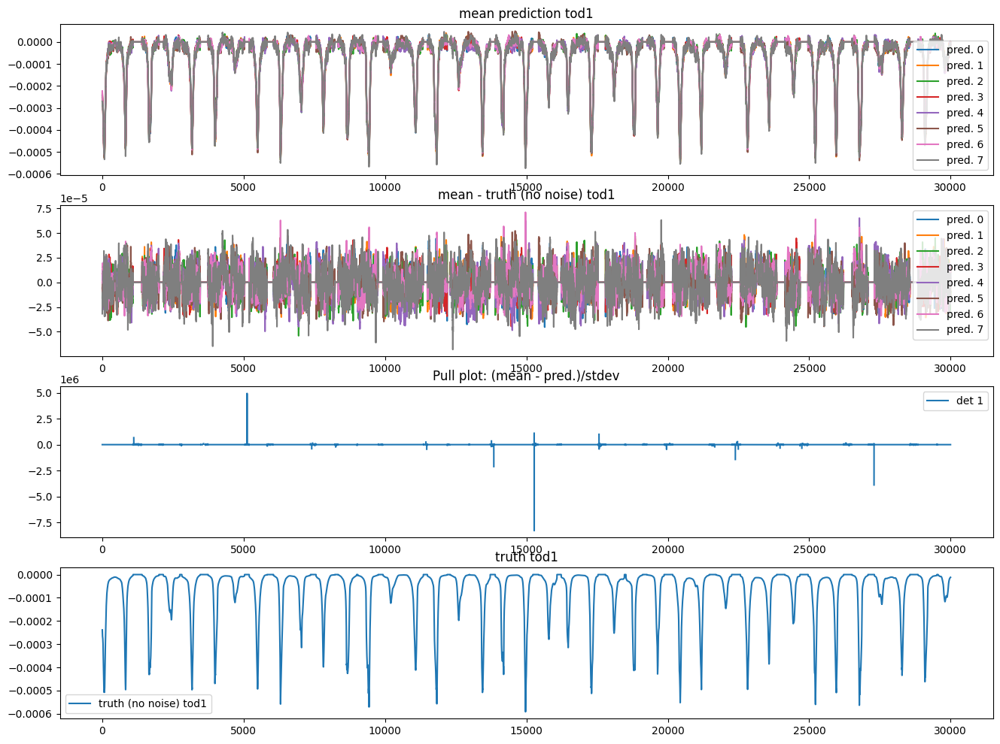

In [35]:
mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

fig, axes = plt.subplots(4, 1, figsize=(16, 12))
i = 1 # TOD id
j = 0
# for i in range(mean.shape[0]):
for s in samples:
    pred = signal_response_tod(s)
    
    im0 = axes[0].plot(np.arange(0, pred.shape[1]), pred[i], label=f"pred. {j}")
    im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - denoised_jax_tod[i], label=f"pred. {j}")
    j += 1

im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - denoised_jax_tod[i])/std[i], label=f"det {i}")
im3 = axes[3].plot(denoised_jax_tod[i], label=f"truth (no noise) tod{i}")
axes[0].title.set_text(f"mean prediction tod{i}")
axes[0].legend()
axes[1].title.set_text(f"mean - truth (no noise) tod{i}")
axes[1].legend()
axes[2].title.set_text(f"Pull plot: (mean - pred.)/stdev")
axes[2].legend()
axes[3].title.set_text(f"truth tod{i}")
axes[3].legend()

plt.show()

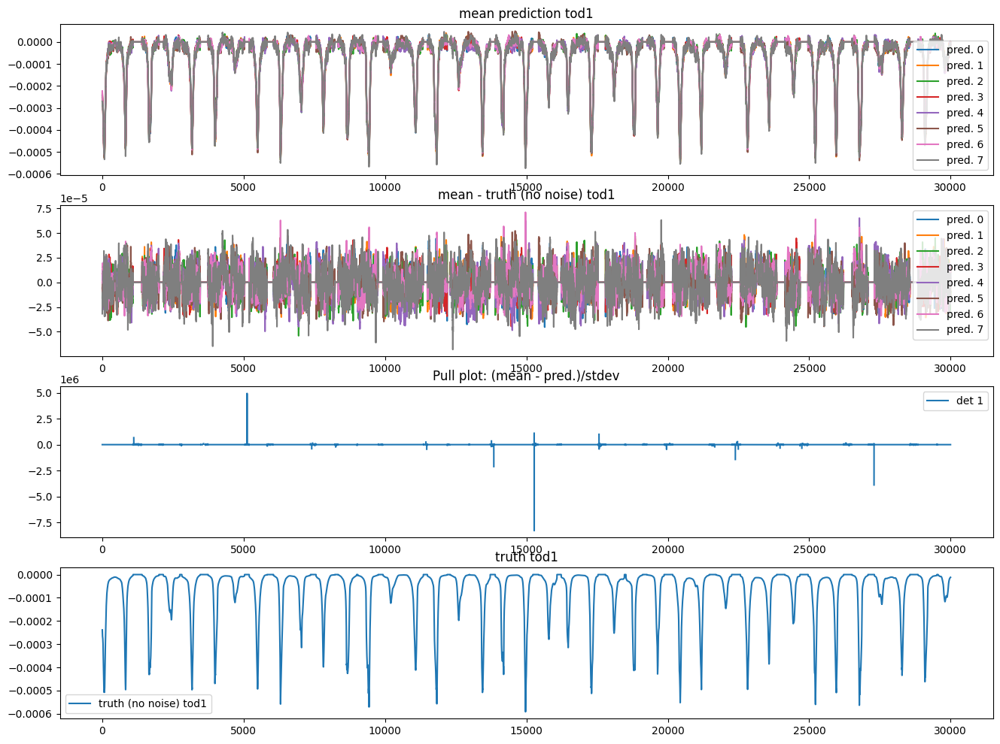

In [36]:
fig, axes = plt.subplots(4, 1, figsize=(16, 12))
i = 1 # TOD id
j = 0
# for i in range(mean.shape[0]):
for s in samples:
    pred = signal_response_tod(s)
    
    im0 = axes[0].plot(np.arange(0, pred.shape[1]), pred[i], label=f"pred. {j}")
    im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - denoised_jax_tod[i], label=f"pred. {j}")
    j += 1

im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - denoised_jax_tod[i])/std[i], label=f"det {i}")
im3 = axes[3].plot(denoised_jax_tod[i], label=f"truth (no noise) tod{i}")
axes[0].title.set_text(f"mean prediction tod{i}")
axes[0].legend()
axes[1].title.set_text(f"mean - truth (no noise) tod{i}")
axes[1].legend()
axes[2].title.set_text(f"Pull plot: (mean - pred.)/stdev")
axes[2].legend()
axes[3].title.set_text(f"truth tod{i}")
axes[3].legend()

plt.show()

## Compare with maria mapper:

In [37]:
# # Re-run simulation without noise for fair comp:
# # instrument = maria.get_instrument('MUSTANG-2')
# instrument = mapsampling_jax.instrument
# instrument.plot()

# sim_truthmap = maria.Simulation(instrument, 
#                                 plan=plan,
#                                 site="llano_de_chajnantor", 
#                                 map=input_map,
#                                 noise=False,
#                                 atmosphere="2d",
#                                 # cmb="generate",
#                                 )

# tod_truthmap = sim_truthmap.run()

In [38]:
# Compare with maria mapper:
from maria.map.mappers import BinMapper

mapper = BinMapper(center=(150, 10),
                   frame="ra_dec",
                   width=0.1,
                   height=0.1,
                   resolution=2e-4,
                   tod_postprocessing={
                        "remove_modes": {"n": 1},
                        # "highpass": {"f": 0.01},
                        "despline": {"spacing": 10},
                    },
                    map_postprocessing={
                        "gaussian_filter": {"sigma": 1},
                        "median_filter": {"size": 1},
                    },
                  )

mapper.add_tods(tod_truthmap)
output_map = mapper.run()

Running mapper (m2/f093): 100%|██████████| 1/1 [00:09<00:00,  9.73s/it]


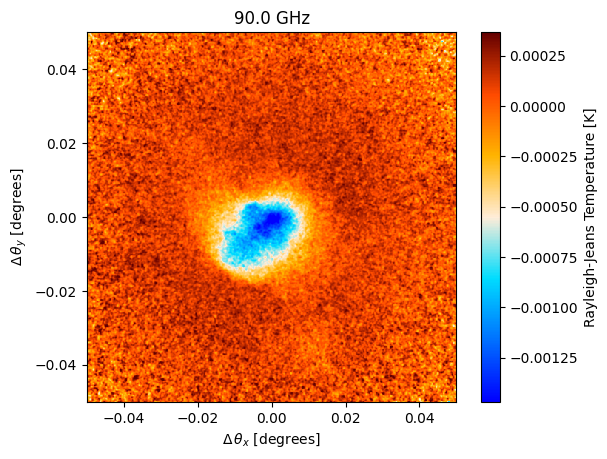

In [39]:
output_map.plot()

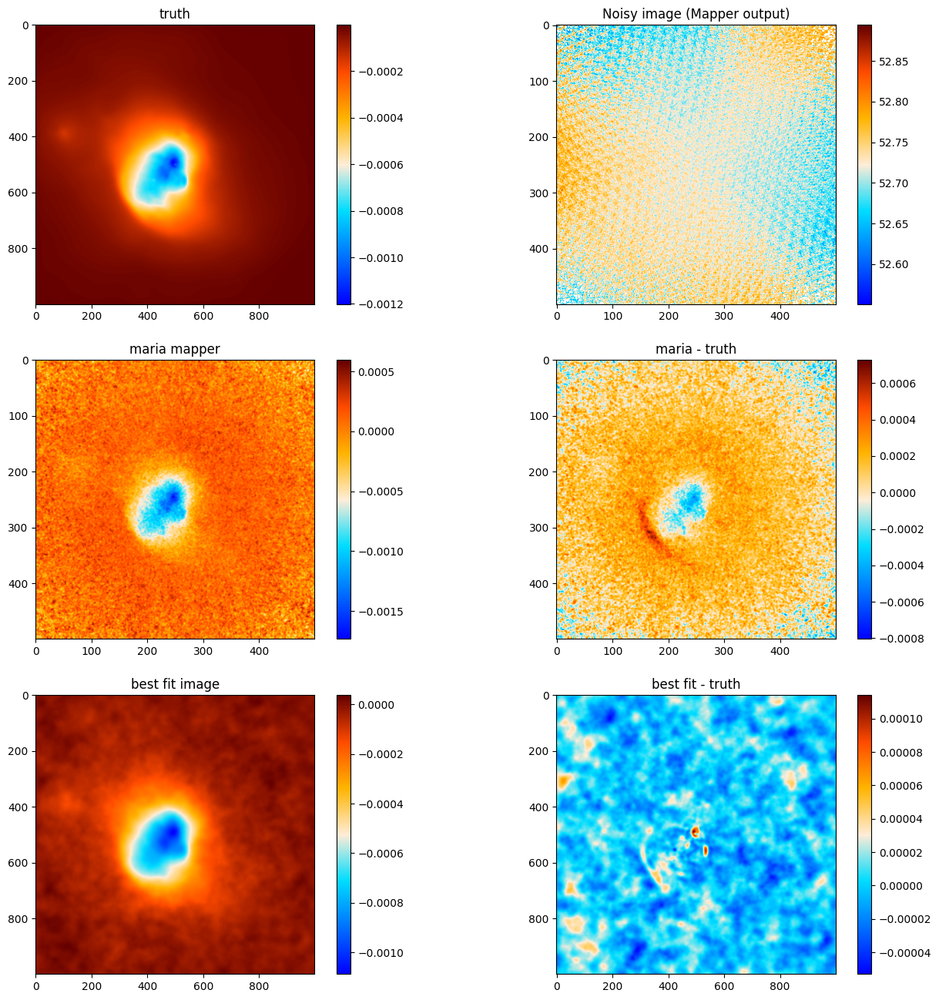

In [40]:
from skimage.transform import resize

# Compare nifty vs maria
sig_map = gp_map(samples.pos) # when splitting up in different field models
# mincol = -0.0012
# maxcol = 0.
mincol = None
maxcol = None

cmb_cmap = plt.get_cmap('cmb')
fig, axes = plt.subplots(3, 2, figsize=(16, 16))

im0 = axes[0,0].imshow( mapdata_truth[0] , cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[0,0].title.set_text('truth')
fig.colorbar(im0)

im1 = axes[0,1].imshow(np.flip(output_truthmap.data[0], axis=(0,1)), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
fig.colorbar(im1)
axes[0,1].title.set_text("Noisy image (Mapper output)")

im2 = axes[1,0].imshow( np.flip(output_map.data[0], axis=(0,1)), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[1,0].title.set_text('maria mapper')
fig.colorbar(im2)

truth_rescaled = resize(mapdata_truth[0], (500, 500), anti_aliasing=True)
im3 = axes[1,1].imshow(( np.flip(output_map.data[0], axis=(0,1)) - truth_rescaled), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[1,1].title.set_text('maria - truth')
fig.colorbar(im3)

im3 = axes[2,0].imshow(sig_map, cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[2,0].title.set_text('best fit image')
fig.colorbar(im3)

im4 = axes[2,1].imshow((sig_map - mapdata_truth[0]), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[2,1].title.set_text('best fit - truth')
fig.colorbar(im4)

plt.show()